# PROJET SUR L'ANALYSE DES INDICATEURS ECONOMIQUES POUR UN CERTAINS PAYS DU MONDE ENTIER  :Le fichier world-data-2023.csv est un ensemble de données contenant des informations socio-économiques, démographiques et géographiques pour de nombreux pays du monde en 2023. Il comprend 195 entrées (pays) et 35 colonnes. voici ces colonnes :Country – Nom du pays
📌 Colonnes principales :
1. Country – Nom du pays

2. Density (P/Km²) – Densité de population (habitants/km²)

3. Abbreviation – Code pays (ex: FR, US, CN)

4. Agricultural Land (%) – Pourcentage de terres agricoles

5. Land Area (Km²) – Superficie totale
6. Armed Forces size – Taille des forces armées

7. Birth Rate – Taux de natalité

8. Calling Code – Indicatif téléphonique

9. Capital/Major City – Capitale ou ville principale

10. Co2-Emissions – Émissions de CO₂

11. CPI – Indice des prix à la consommation

12. CPI Change (%) – Taux d'inflation


13. Currency-Code – Code de la devise

14. Fertility Rate – Taux de fécondité

15. Forested Area (%) – Pourcentage de forêts

16. Gasoline Price – Prix de l'essence (en dollars)

17. GDP – Produit intérieur brut

18. Gross primary/tertiary education enrollment (%) – Taux de scolarisation

19. Infant mortality – Mortalité infantile

20. Largest city – Plus grande ville

21. Life expectancy – Espérance de vie

22. Maternal mortality ratio – Taux de mortalité maternelle

23. Minimum wage – Salaire minimum (en dollars) 
24. Official language – Langue officielle

25. Out of pocket health expenditure – Dépenses de santé à la charge des patients

26. Physicians per thousand – Nombre de médecins pour 1000 habitants

27. Population – Population totale

28. Labor force participation (%) – Taux de participation au marché du travail

29. Tax revenue (%) – Revenus fiscaux en % du PIB

30. Total tax rate – Taux d'imposition total

31. Unemployment rate – Taux de chômage
32. Urban_population – Population urbaine
33. Latitude / Longitude – Coordonnées géographiques
Voici un aperçu des principales catégories de données incluses :
### BUT DU PROJET est :
1. étude des  relations entre les indicateurs
2. etudes comparatives entre pays en se basant sur quelques indicateurs clés
## nous allons travailler avec un dataset  de kaagle ,il sied de signaler que notre projet est divisé en deux section à savoir :
1. analyse descriptive
2. apprentissage non supervisé avec ACP

In [1]:
import pandas as pd
import numpy as np
import seaborn as sn
import matplotlib.pyplot as plt
from scipy.stats import levene,shapiro,spearmanr,ttest_ind,f_oneway,kruskal
import scikit_na as na
import  missingno as msno
import pingouin as pg
from scipy.stats import chi2_contingency





## 1. ANALYSE EXPLORATOIRE

In [2]:
data= pd.read_csv("dataset\world-data-2023.csv")

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 195 entries, 0 to 194
Data columns (total 35 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   Country                                    195 non-null    object 
 1   Density
(P/Km2)                            195 non-null    object 
 2   Abbreviation                               188 non-null    object 
 3   Agricultural Land( %)                      188 non-null    object 
 4   Land Area(Km2)                             194 non-null    object 
 5   Armed Forces size                          171 non-null    object 
 6   Birth Rate                                 189 non-null    float64
 7   Calling Code                               194 non-null    float64
 8   Capital/Major City                         192 non-null    object 
 9   Co2-Emissions                              188 non-null    object 
 10  CPI                       

In [4]:
"""nous écartons toutes les colonnes ayant 23% des valeurs manquantes"""
data=data[data.columns[(data.isnull().sum()/data.shape[0])<0.23]]

In [5]:
(data.isnull().sum()/data.shape[0]).sort_values(ascending=False)
# après nous affichons toutes les colonnes ayant moins de 23% des valeurs manquantes

Tax revenue (%)                              0.133333
Armed Forces size                            0.123077
Gasoline Price                               0.102564
Population: Labor force participation (%)    0.097436
Unemployment rate                            0.097436
CPI                                          0.087179
CPI Change (%)                               0.082051
Currency-Code                                0.076923
Maternal mortality ratio                     0.071795
Total tax rate                               0.061538
Gross tertiary education enrollment (%)      0.061538
Life expectancy                              0.041026
Physicians per thousand                      0.035897
Out of pocket health expenditure             0.035897
Gross primary education enrollment (%)       0.035897
Fertility Rate                               0.035897
Co2-Emissions                                0.035897
Agricultural Land( %)                        0.035897
Abbreviation                

<Axes: >

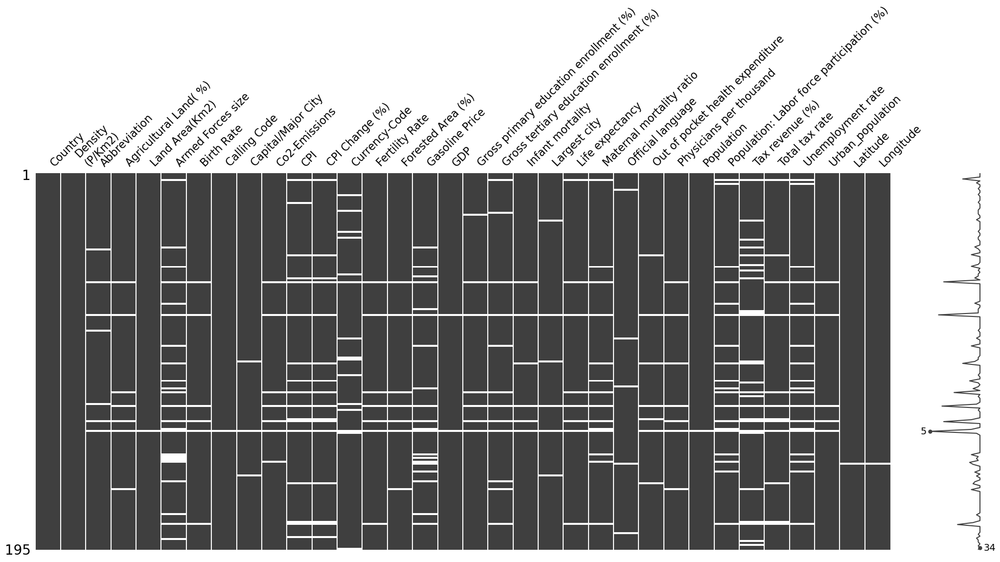

In [6]:
msno.matrix(data)

Text(0.5, 1.0, 'correation de valeurs manquantes')

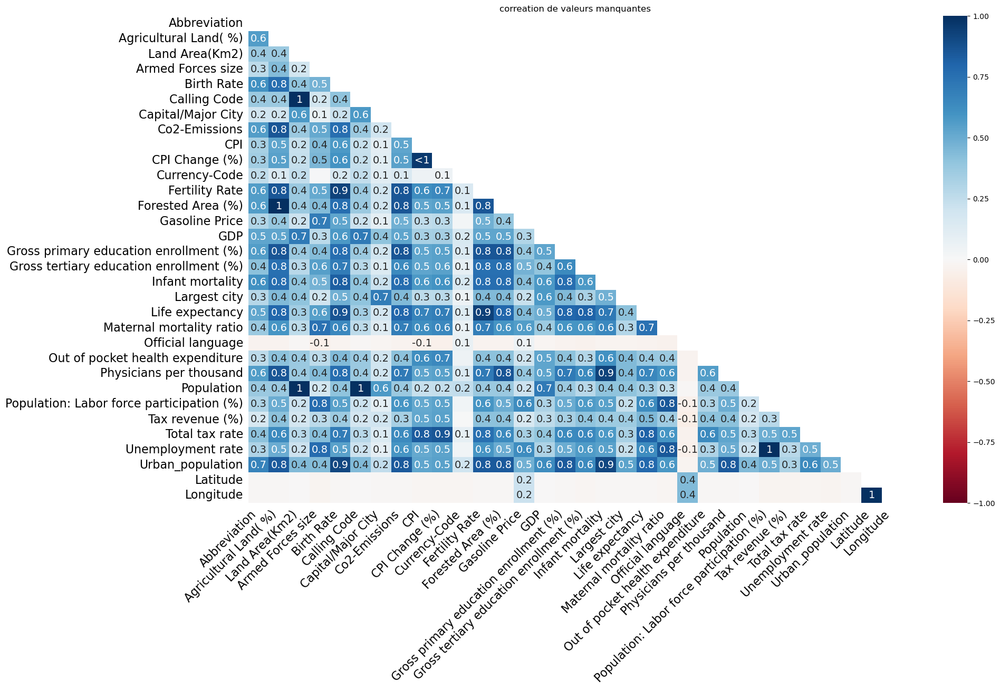

In [7]:
msno.heatmap(data)
plt.title("correation de valeurs manquantes")

Text(0.5, 1.0, 'Heatmap des valeurs manquantes')

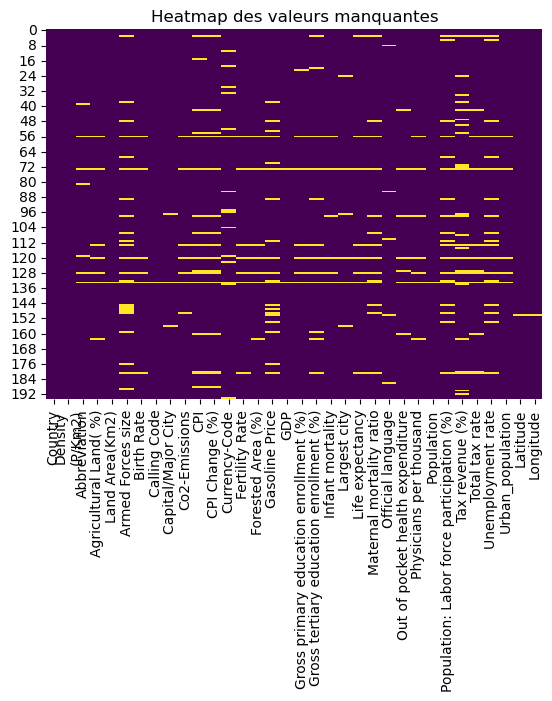

In [8]:
sn.heatmap(data.isnull(),cbar=False,cmap='viridis')
plt.title("Heatmap des valeurs manquantes")

In [9]:
# nous affichons le resumé des valeurs manquantes pour chaque colonnes
summary =na.summary(data)

In [10]:
pd.DataFrame(summary)

,Country,Density\n(P/Km2),Abbreviation,Agricultural Land( %),Land Area(Km2),Armed Forces size,Birth Rate,Calling Code,Capital/Major City,Co2-Emissions,...,Out of pocket health expenditure,Physicians per thousand,Population,Population: Labor force participation (%),Tax revenue (%),Total tax rate,Unemployment rate,Urban_population,Latitude,Longitude
na_count,0.0,0.0,7.00,7.00,1.00,24.00,6.00,1.00,3.00,7.00,...,7.00,7.00,1.00,19.00,26.00,12.00,19.00,5.00,1.00,1.00
na_pct_per_col,0.0,0.0,3.59,3.59,0.51,12.31,3.08,0.51,1.54,3.59,...,3.59,3.59,0.51,9.74,13.33,6.15,9.74,2.56,0.51,0.51
na_pct_total,0.0,0.0,2.36,2.36,0.34,8.11,2.03,0.34,1.01,2.36,...,2.36,2.36,0.34,6.42,8.78,4.05,6.42,1.69,0.34,0.34
na_unique_per_col,0.0,0.0,2.00,0.00,0.00,3.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,9.00,0.00,0.00,0.00,0.00,0.00
na_unique_pct_per_col,0.0,0.0,28.57,0.00,0.00,12.50,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,34.62,0.00,0.00,0.00,0.00,0.00
rows_after_dropna,195.0,195.0,188.00,188.00,194.00,171.00,189.00,194.00,192.00,188.00,...,188.00,188.00,194.00,176.00,169.00,183.00,176.00,190.00,194.00,194.00
rows_after_dropna_pct,100.0,100.0,96.41,96.41,99.49,87.69,96.92,99.49,98.46,96.41,...,96.41,96.41,99.49,90.26,86.67,93.85,90.26,97.44,99.49,99.49


In [11]:
missing_summary=data.isnull().sum().to_frame("missing count")
missing_summary['% missing'] =100*data.isna().mean()
missing_summary['% missing'].sort_values(ascending=False)

Tax revenue (%)                              13.333333
Armed Forces size                            12.307692
Gasoline Price                               10.256410
Population: Labor force participation (%)     9.743590
Unemployment rate                             9.743590
CPI                                           8.717949
CPI Change (%)                                8.205128
Currency-Code                                 7.692308
Maternal mortality ratio                      7.179487
Total tax rate                                6.153846
Gross tertiary education enrollment (%)       6.153846
Life expectancy                               4.102564
Physicians per thousand                       3.589744
Out of pocket health expenditure              3.589744
Gross primary education enrollment (%)        3.589744
Fertility Rate                                3.589744
Co2-Emissions                                 3.589744
Agricultural Land( %)                         3.589744
Abbreviati

In [12]:
def affect_pays_continent(country_name):
    """
    Mapping manuel des pays vers les continents
    """
    # Définition des pays par continent
    europe = ['Albania', 'Andorra', 'Austria', 'Belarus', 'Belgium', 'Bosnia and Herzegovina',
             'Bulgaria', 'Croatia', 'Cyprus', 'Czech Republic', 'Denmark', 'Estonia', 
             'Finland', 'France', 'Germany', 'Greece', 'Hungary', 'Iceland', 'Ireland',
             'Italy', 'Latvia', 'Liechtenstein', 'Lithuania', 'Luxembourg', 'Malta',
             'Moldova', 'Monaco', 'Montenegro', 'Netherlands', 'North Macedonia', 'Norway',
             'Poland', 'Portugal', 'Romania', 'Russia', 'San Marino', 'Serbia', 'Slovakia',
             'Slovenia', 'Spain', 'Sweden', 'Switzerland', 'Ukraine', 'United Kingdom',
             'Vatican City','Republic of Ireland']
    
    asia = ['Afghanistan', 'Armenia', 'Azerbaijan', 'Bahrain', 'Bangladesh', 'Bhutan',
           'Brunei', 'Cambodia', 'China', 'Georgia', 'India', 'Indonesia', 'Iran',
           'Iraq', 'Israel', 'Japan', 'Jordan', 'Kazakhstan', 'Kuwait', 'Kyrgyzstan',
           'Laos', 'Lebanon', 'Malaysia', 'Maldives', 'Mongolia', 'Myanmar', 'Nepal',
           'North Korea', 'Oman', 'Pakistan', 'Palestinian National Authority', 'Philippines',
           'Qatar', 'Saudi Arabia', 'Singapore', 'South Korea', 'Sri Lanka', 'Syria',
           'Tajikistan', 'Thailand', 'Timor-Leste', 'Turkey', 'Turkmenistan', 'United Arab Emirates',
           'Uzbekistan', 'Vietnam', 'Yemen','East Timor']
    
    africa = ['Algeria', 'Angola', 'Benin', 'Botswana', 'Burkina Faso', 'Burundi',
             'Cabo Verde', 'Cameroon', 'Central African Republic', 'Chad', 'Comoros',
             'Congo', 'Democratic Republic of the Congo', 'Djibouti', 'Egypt',
             'Equatorial Guinea', 'Eritrea', 'Eswatini', 'Ethiopia', 'Gabon', 'Gambia',
             'Ghana', 'Guinea', 'Guinea-Bissau', 'Ivory Coast', 'Kenya', 'Lesotho',
             'Liberia', 'Libya', 'Madagascar', 'Malawi', 'Mali', 'Mauritania', 'Mauritius',
             'Morocco', 'Mozambique', 'Namibia', 'Niger', 'Nigeria', 'Rwanda', 'Sao Tome and Principe',
             'Senegal', 'Seychelles', 'Sierra Leone', 'Somalia', 'South Africa', 'South Sudan',
             'Sudan', 'Tanzania', 'Togo', 'Tunisia', 'Uganda', 'Zambia', 'Zimbabwe','Republic of the Congo','Cape Verde','The Gambia']
    
    north_america = ['Antigua and Barbuda', 'Bahamas', 'Barbados', 'Belize', 'Canada',
                    'Costa Rica', 'Cuba', 'Dominica', 'Dominican Republic', 'El Salvador',
                    'Grenada', 'Guatemala', 'Haiti', 'Honduras', 'Jamaica', 'Mexico',
                    'Nicaragua', 'Panama', 'Saint Kitts and Nevis', 'Saint Lucia',
                    'Saint Vincent and the Grenadines', 'Trinidad and Tobago', 'United States','The Bahamas']
    
    south_america = ['Argentina', 'Bolivia', 'Brazil', 'Chile', 'Colombia', 'Ecuador',
                    'Guyana', 'Paraguay', 'Peru', 'Suriname', 'Uruguay', 'Venezuela']
    
    oceania = ['Australia', 'Fiji', 'Kiribati', 'Marshall Islands', 'Micronesia',
              'Nauru', 'New Zealand', 'Palau', 'Papua New Guinea', 'Samoa',
              'Solomon Islands', 'Tonga', 'Tuvalu', 'Vanuatu','Federated States of Micronesia']
    
    if country_name in europe:
        return 'Europe'
    elif country_name in asia:
        return 'Asia'
    elif country_name in africa:
        return 'Africa'
    elif country_name in north_america:
        return 'North America'
    elif country_name in south_america:
        return 'South America'
    elif country_name in oceania:
        return 'Oceania'
    else:
        return 'Unknown'

In [13]:
data.drop(150,axis=0,inplace=True)

In [14]:
def corr_manq(df) :
    missing_mask = df.isna()

    # Calculer la corrélation entre les colonnes manquantes
    missing_corr = missing_mask.corr()

    # Seuil pour considérer la corrélation comme "forte"
    threshold = 0.3

    # Colonnes fortement corrélées entre elles
    strongly_corr = {col: missing_corr[col][missing_corr[col] > threshold].index.tolist()
                    for col in missing_corr.columns if any(missing_corr[col] > threshold)}

    # Colonnes isolées (pas de corrélation forte avec d'autres)
    isolated_cols = [col for col in missing_corr.columns if all(missing_corr[col] <= threshold)]
    print("Colonnes fortement corrélées :", strongly_corr)
    print("Colonnes isolées :", isolated_cols)

In [15]:
def corr_manque(df) :
        df_num=df.select_dtypes(exclude='object')

        corr_matrix = df_num.corr()

        # 5️⃣ Identifier colonnes corrélées et isolées
        threshold = 0.30  # Seuil de corrélation
        corr_cols = []
        isolated_cols = []

        for col in df_num.columns:
            corr_with_others = corr_matrix[col].drop(col).abs()
            if any(corr_with_others > threshold):
                corr_cols.append(col)
        print(f"Colonnes corrélées (> {threshold}) : {corr_cols}")
        print(f"Colonnes isolées (< {threshold}) : {isolated_cols}")

In [16]:
def test_missingness_patterns(df, alpha=0.05):
    """
    Teste automatiquement les types de valeurs manquantes pour chaque colonne d'un DataFrame.
    Utilise des tests de corrélation (numériques) et chi² (catégorielles).
    
    Retourne un DataFrame avec :
    - la colonne testée
    - les colonnes corrélées
    - la p-value minimale
    - la conclusion sur le type de valeurs manquantes
    """
    results = []
    
    # Colonnes numériques et catégorielles
    num_cols = df.select_dtypes(include=[np.number]).columns
    cat_cols = df.select_dtypes(exclude=[np.number]).columns
    
    # Créer les indicateurs de valeurs manquantes
    missing_cols = []
    for col in df.columns:
        df[col + "_missing"] = df[col].isna().astype(int)
        missing_cols.append(col + "_missing")
    
    # Tester chaque colonne manquante
    for miss_col in missing_cols:
        var_name = miss_col.replace("_missing", "")
        min_pval = 1.0
        correlated_vars = []
        
        # --- Tests avec variables numériques
        for other in num_cols:
            if other != var_name:
                try:
                    res = pg.corr(df[miss_col], df[other])
                    pval = res['p-val'].values[0]
                    if pval < alpha:
                        correlated_vars.append(other)
                        min_pval = min(min_pval, pval)
                except:
                    pass
        
        # --- Tests avec variables catégorielles
        for other in cat_cols:
            if other != var_name:
                try:
                    contingency = pd.crosstab(df[miss_col], df[other])
                    chi2, pval, dof, expected = chi2_contingency(contingency)
                    if pval < alpha:
                        correlated_vars.append(other)
                        min_pval = min(min_pval, pval)
                except:
                    pass
        
        # --- Interprétation du type de manquants
        if len(correlated_vars) == 0:
            missing_type = "MCAR (Aléatoire)"
        elif len(correlated_vars) > 0:
            missing_type = "MAR (Dépend d'autres variables)"
        else:
            missing_type = "MNAR (Non expliqué)"
        
        results.append({
            "Variable": var_name,
            "Colonnes_corrélées": correlated_vars if correlated_vars else None,
            "p-value_min": round(min_pval, 4),
            "Type_probable": missing_type
        })
    
    # Nettoyer le DataFrame
    result_df = pd.DataFrame(results)
    result_df.sort_values(by="p-value_min", inplace=True)
    
    return result_df


In [17]:
data.drop(['Abbreviation','Currency-Code'],axis=1,inplace=True)

le doublon False    194
Name: count, dtype: int64

=== Variables numériques ===


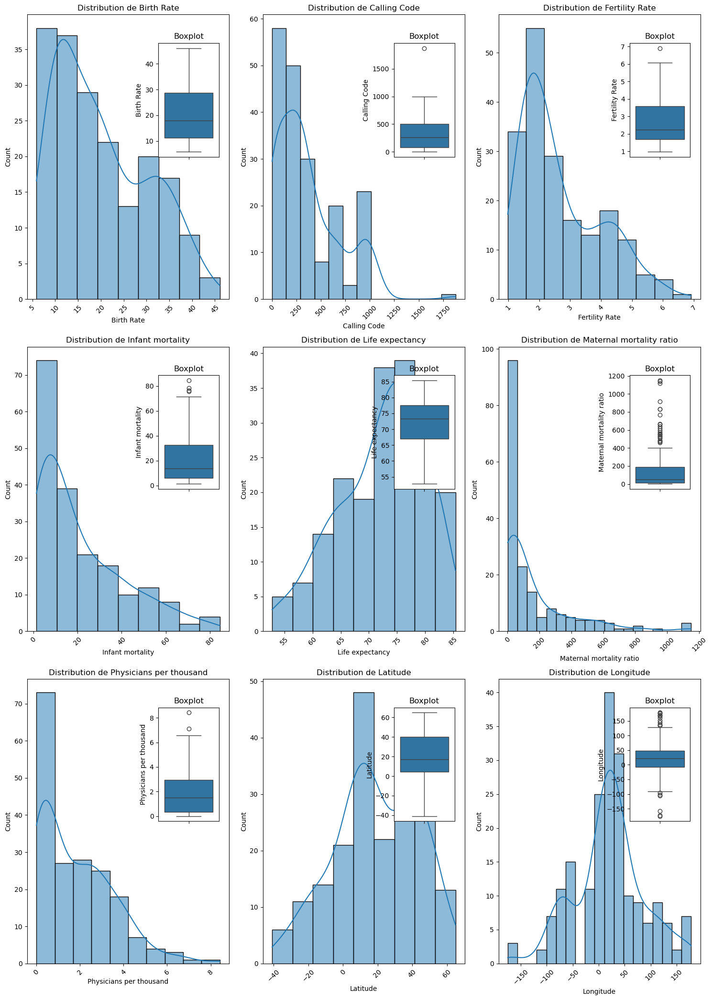


Statistiques descriptives :
       Birth Rate  Calling Code  Fertility Rate  Infant mortality  \
count  188.000000    193.000000      187.000000        188.000000   
mean    20.154734    361.176166        2.689465         21.316489   
std      9.937700    323.957736        1.280169         19.598966   
min      5.900000      1.000000        0.980000          1.400000   
25%     11.225000     82.000000        1.700000          5.975000   
50%     17.915000    256.000000        2.240000         13.950000   
75%     28.667500    507.000000        3.580000         32.750000   
max     46.080000   1876.000000        6.910000         84.500000   

       Life expectancy  Maternal mortality ratio  Physicians per thousand  \
count       186.000000                180.000000               187.000000   
mean         72.290860                160.561111                 1.849412   
std           7.502293                234.142276                 1.683648   
min          52.800000                  2

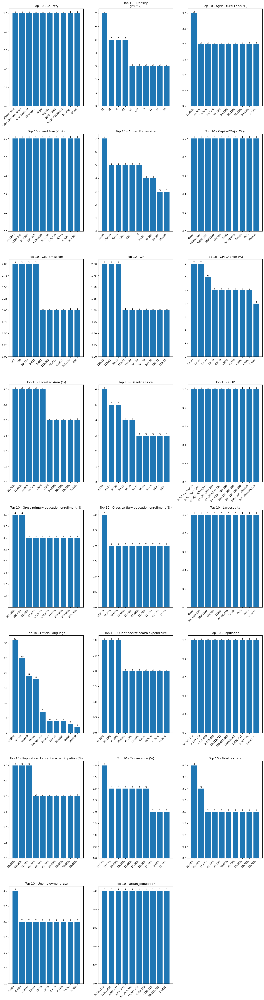


Proportion des catégories :

Country:
Country
Afghanistan              0.5%
Saint Kitts and Nevis    0.5%
New Zealand              0.5%
Nicaragua                0.5%
Niger                    0.5%
Nigeria                  0.5%
North Korea              0.5%
North Macedonia          0.5%
Norway                   0.5%
Oman                     0.5%
Name: proportion, dtype: object

Density
(P/Km2):
Density\n(P/Km2)
25     3.6%
18     2.6%
4      2.6%
83     2.6%
16     1.5%
137    1.5%
3      1.5%
17     1.5%
26     1.5%
20     1.5%
Name: proportion, dtype: object

Agricultural Land( %):
Agricultural Land( %)
17.40%    1.6%
39.30%    1.1%
23.30%    1.1%
23.10%    1.1%
73.40%    1.1%
34.50%    1.1%
31.10%    1.1%
71.50%    1.1%
64.80%    1.1%
2.70%     1.1%
Name: proportion, dtype: object

Land Area(Km2):
Land Area(Km2)
652,230      0.5%
1,759,540    0.5%
268,838      0.5%
130,370      0.5%
1,267,000    0.5%
923,768      0.5%
120,538      0.5%
25,713       0.5%
323,802      0.5%
309,500     

In [18]:
def visualiser_variables_cote_a_cote(df, n_cols=2, figsize=(15, 5)):
    """
    Visualise les variables côte à côte avec diagrammes en barres pour les catégorielles
    
    Parameters:
    -----------
    df : pandas DataFrame
        Le DataFrame à analyser
    n_cols : int
        Nombre de graphiques par ligne
    figsize : tuple
        Taille de base pour chaque groupe de graphiques
    """
    # Séparer les variables par type
    print('le doublon',data.duplicated().value_counts())
    num_cols = df.select_dtypes(include=[np.number]).columns
    cat_cols = df.select_dtypes(exclude=[np.number]).columns
    
    def create_subplot_grid(n_vars, n_cols):
        n_rows = (n_vars + n_cols - 1) // n_cols
        fig_height = figsize[1] * n_rows
        return plt.subplots(n_rows, n_cols, figsize=(figsize[0], fig_height))
    
    # Visualiser les variables numériques
    if len(num_cols) > 0:
        print("\n=== Variables numériques ===")
        fig, axes = create_subplot_grid(len(num_cols), n_cols)
        if len(num_cols) == 1:
            axes = np.array([axes])
        axes = axes.flatten()
        
        for idx, col in enumerate(num_cols):
            if idx < len(axes):
                # Créer deux sous-graphiques côte à côte
                ax1 = axes[idx]
                
                # Histogramme
                sn.histplot(data=df, x=col, kde=True, ax=ax1)
                ax1.set_title(f'Distribution de {col}')
                ax1.tick_params(axis='x', rotation=45)
                
                # Boxplot en insert
                ins = ax1.inset_axes([0.65, 0.5, 0.3, 0.4])
                sn.boxplot(data=df, y=col, ax=ins)
                ins.set_title('Boxplot')
        
        for idx in range(len(num_cols), len(axes)):
            axes[idx].set_visible(False)
            
        plt.tight_layout()
        plt.show()
        
        # Statistiques descriptives
        print("\nStatistiques descriptives :")
        print(df[num_cols].describe())
    
    # Visualiser les variables catégorielles avec diagrammes en barres
    if len(cat_cols) > 0:
        print("\n=== Variables catégorielles ===")
        fig, axes = create_subplot_grid(len(cat_cols), n_cols)
        if len(cat_cols) == 1:
            axes = np.array([axes])
        axes = axes.flatten()
        
        for idx, col in enumerate(cat_cols):
            if idx < len(axes):
                # Calculer les fréquences
                value_counts = df[col].value_counts()
                if len(value_counts) > 10:
                    value_counts = value_counts.head(10)
                
                # Diagramme en barres vertical
                plt.sca(axes[idx])
                bars = plt.bar(range(len(value_counts)), value_counts.values)
                plt.title(f'Top 10 - {col}')
                plt.xticks(range(len(value_counts)), value_counts.index, rotation=45, ha='right')
                
                # Ajouter les valeurs sur les barres
                for bar in bars:
                    height = bar.get_height()
                    plt.text(bar.get_x() + bar.get_width()/2., height,
                            f'{int(height)}', ha='center', va='bottom')
        
        for idx in range(len(cat_cols), len(axes)):
            axes[idx].set_visible(False)
            
        plt.tight_layout()
        plt.show()
        
        # Afficher les proportions
        print("\nProportion des catégories :")
        for col in cat_cols:
            print(f"\n{col}:")
            prop = df[col].value_counts(normalize=True).head(10)
            print(prop.apply(lambda x: f"{x:.1%}"))

# Utilisation de la fonction
visualiser_variables_cote_a_cote(data, n_cols=3, figsize=(15, 7))

In [19]:
def analyse_bivariee(df, threshold_corr=0.5, alpha=0.05):
    """
    Réalise une analyse bivariée avec tests d'hypothèse pour les corrélations
    
    Parameters:
    -----------
    df : pandas DataFrame
        Le DataFrame à analyser
    threshold_corr : float
        Seuil de corrélation significative
    alpha : float
        Seuil de significativité pour les tests statistiques
    """
    # Séparer les variables numériques et catégorielles
    num_cols = df.select_dtypes(include=[np.number]).columns
    cat_cols = df.select_dtypes(exclude=[np.number]).columns
    
    # 1. Analyse entre variables numériques
    print("=== Analyse entre variables numériques ===")
    if len(num_cols) > 1:
        # Calculer la matrice de corrélation
        corr_matrix = df[num_cols].corr()
        
        # Style pour le DataFrame
        def color_corr(val):
            if pd.isna(val):
                return 'background-color: #EEEEEE'
            if val == 1:
                color = '#D9D9D9'
            elif val >= 0.7:
                color = '#FF9999'
            elif val >= 0.5:
                color = '#FFB366'
            elif val <= -0.7:
                color = '#9999FF'
            elif val <= -0.5:
                color = '#99CCFF'
            else:
                color = '#FFFFFF'
            return f'background-color: {color}'
        
        # Afficher la matrice de corrélation stylisée
        styled_corr = corr_matrix.style\
            .format("{:.3f}")\
            .apply(lambda x: [color_corr(v) for v in x])\
            .set_caption("Matrice de corrélation des variables numériques")
        display(styled_corr)
        
        # Analyser les corrélations significatives
        print(f"\nCorrélations significatives (|corr| > {threshold_corr}) :")
        significant_corr = []
        
        for i in range(len(num_cols)):
            for j in range(i+1, len(num_cols)):
                # Préparer les données sans valeurs manquantes
                data_clean = df[[num_cols[i], num_cols[j]]].dropna()
                if len(data_clean) < 2:
                    continue
                    
                # Tests statistiques
                try:
                    # Test de Pearson
                    pearson_corr = pg.corr(data_clean[num_cols[i]], 
                                         data_clean[num_cols[j]], 
                                         method='pearson')
                    
                    # Test de Spearman
                    spearman_corr = pg.corr(data_clean[num_cols[i]], 
                                          data_clean[num_cols[j]], 
                                          method='spearman')
                    
                    corr = pearson_corr['r'].values[0]
                    
                    if abs(corr) > threshold_corr:
                        significant_corr.append({
                            'Variable 1': num_cols[i],
                            'Variable 2': num_cols[j],
                            'Corrélation Pearson': pearson_corr['r'].values[0],
                            'P-value Pearson': pearson_corr['p-val'].values[0],
                            'Corrélation Spearman': spearman_corr['r'].values[0],
                            'P-value Spearman': spearman_corr['p-val'].values[0],
                            'Nombre observations': len(data_clean)
                        })
                        
                        # Visualisation
                        if len(data_clean) > 0:
                            plt.figure(figsize=(12, 5))
                            
                            # Nuage de points
                            plt.subplot(121)
                            plt.scatter(data_clean[num_cols[i]], data_clean[num_cols[j]], alpha=0.5)
                            plt.xlabel(num_cols[i])
                            plt.ylabel(num_cols[j])
                            plt.title(f"Nuage de points\n(n={len(data_clean)} observations)")
                            
                            # Régression
                            plt.subplot(122)
                            sn.regplot(data=data_clean, x=num_cols[i], y=num_cols[j])
                            plt.title(f"Régression linéaire\nPearson: {corr:.3f} (p={pearson_corr['p-val'].values[0]:.3f})")
                            
                            plt.tight_layout()
                            plt.show()
                            
                except Exception as e:
                    print(f"Erreur lors du test pour {num_cols[i]} et {num_cols[j]}: {str(e)}")
                    continue
        
        # Afficher le résumé des corrélations significatives
        if significant_corr:
            sig_df = pd.DataFrame(significant_corr)
            styled_sig = sig_df.style\
                .format({
                    'Corrélation Pearson': '{:.3f}',
                    'P-value Pearson': '{:.3e}',
                    'Corrélation Spearman': '{:.3f}',
                    'P-value Spearman': '{:.3e}',
                    'Nombre observations': '{:d}'
                })\
                .background_gradient(subset=['Corrélation Pearson'], cmap='coolwarm')\
                .set_caption("Corrélations significatives avec tests statistiques")
            
            display(styled_sig)
            
            # Afficher les conclusions des tests
            print("\nConclusions des tests statistiques :")
            for corr in significant_corr:
                print(f"\n{corr['Variable 1']} vs {corr['Variable 2']}:")
                print(f"- Corrélation de Pearson : {corr['Corrélation Pearson']:.3f}")
                if corr['P-value Pearson'] < alpha:
                    print(f"  → Significatif (p={corr['P-value Pearson']:.3e})")
                else:
                    print(f"  → Non significatif (p={corr['P-value Pearson']:.3e})")
                    
                print(f"- Corrélation de Spearman : {corr['Corrélation Spearman']:.3f}")
                if corr['P-value Spearman'] < alpha:
                    print(f"  → Significatif (p={corr['P-value Spearman']:.3e})")
                else:
                    print(f"  → Non significatif (p={corr['P-value Spearman']:.3e})")
        else:
            print("Aucune corrélation significative trouvée.")

# Utilisation de la fonction


In [20]:
def analyse_num_cat(df, max_categories=10,pays1='D',pays2="R", figsize=(15, 6)):
    """
    Visualise et analyse les relations entre les variables numériques et la variable 'Country'
    """
    # Sélectionner les variables
    num_cols = df.select_dtypes(include=[np.number]).columns
    
    # Préparer les données pour Country
    df=df.loc[(df['Country'].str.startswith(pays1))|(df['Country'].str.startswith(pays2))]
    value_counts = df['Country'].value_counts().sort_values(ascending=False)
    
    top_countries = value_counts.head(max_categories).index
    df_filtered = df[df['Country'].isin(top_countries)]
    
    print(f"\nAnalyse pour les {max_categories} premiers pays")
    
    for num_col in num_cols:
        # Nettoyer les données
        data_clean = df_filtered[['Country', num_col]].dropna()
        if len(data_clean) < 2:
            continue
            
        # Visualisations
        plt.figure(figsize=figsize)
        
        plt.subplot(131)
        sn.boxplot(data=data_clean, x='Country', y=num_col)
        plt.xticks(rotation=45, ha='right')
        plt.title('Distribution par pays')
        
        plt.subplot(132)
        sn.violinplot(data=data_clean, x='Country', y=num_col)
        plt.xticks(rotation=45, ha='right')
        plt.title('Densité de distribution')
        
        plt.subplot(133)
        sn.stripplot(data=data_clean, x='Country', y=num_col, alpha=0.4, jitter=0.2)
        plt.xticks(rotation=45, ha='right')
        plt.title('Observations individuelles')
        
        plt.suptitle(f'Analyse de {num_col} par pays', y=1.02)
        plt.tight_layout()
        plt.show()
        
        # Statistiques descriptives modifiées
        desc_stats = data_clean.groupby('Country')[num_col].agg(['count', 'mean', 'min', 'max'])
        desc_stats.columns = ['Nombre', 'Moyenne', 'Minimum', 'Maximum']
        
        # Statistiques globales
        global_stats = pd.Series({
            'Moyenne globale': data_clean[num_col].mean(),
            'Médiane globale': data_clean[num_col].median(),
            'Écart-type global': data_clean[num_col].std(),
            'Minimum global': data_clean[num_col].min(),
            'Maximum global': data_clean[num_col].max()
        })
        
        print(f"\nStatistiques descriptives pour {num_col}:")
        print("\nPar pays :")
        print(desc_stats.round(2))
        print("\nStatistiques globales :")
        print(global_stats.round(2))
        
        # Test de Kruskal-Wallis
        try:
            groups_data = [group[num_col].values for name, group in data_clean.groupby('Country')]
            stat, p_val = kruskal(*groups_data)
            print(f"\nTest de Kruskal-Wallis:")
            print(f"p-value = {p_val:.4f}")
            
            if p_val > 0.05:
                print("\nConclusion:")
                print(f"✓ Pas de différence significative entre les pays pour {num_col}")
                print("→ La distribution est similaire entre les pays")
                print("→ Les variations observées sont probablement dues au hasard")
                
                # Comparaison à la moyenne globale
                mean_global = global_stats['Moyenne globale']
                for country in desc_stats.index:
                    value = desc_stats.loc[country, 'Moyenne']
                    diff_pct = ((value - mean_global) / mean_global) * 100
                    print(f"\n{country}:")
                    print(f"- Valeur: {value:.2f}")
                    print(f"- Écart à la moyenne: {diff_pct:+.1f}%")
                    if abs(diff_pct) > 50:
                        print("  ⚠️ Écart important à la moyenne")
                    
            else:
                print("\nConclusion:")
                print(f"! Différence significative entre les pays pour {num_col}")
                print("→ Il existe des variations systématiques entre les pays")
                
                # Identifier les pays extrêmes
                max_country = desc_stats['Moyenne'].idxmax()
                min_country = desc_stats['Moyenne'].idxmin()
                print(f"\nPays extrêmes:")
                print(f"- Valeur la plus élevée: {max_country} ({desc_stats.loc[max_country, 'Moyenne']:.2f})")
                print(f"- Valeur la plus faible: {min_country} ({desc_stats.loc[min_country, 'Moyenne']:.2f})")
            
        except Exception as e:
            print(f"\nErreur lors des tests statistiques: {str(e)}")
        
        print("\n" + "="*80)



## 2. NETTOYAGE DE DONNEES

In [21]:
from sklearn.experimental import enable_iterative_imputer  # nécessaire
from sklearn.impute import SimpleImputer, KNNImputer

In [22]:
def remplacer(value) :
    if isinstance(value,str) :
        return value.replace('%','').replace('$','')
    return value

In [23]:
data_clean = data.applymap(remplacer)
data_clean.drop("Calling Code",axis=1,inplace=True)

C:\Users\lauredie\AppData\Local\Temp\ipykernel_3492\1921449919.py:1: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  data_clean = data.applymap(remplacer)


In [24]:
colonne_int=[ 'Urban_population',  'Population', 'GDP','Co2-Emissions','Armed Forces size','Land Area(Km2)','Density\n(P/Km2)']
cat =['Country', 'Abbreviation','Capital/Major City','Currency-Code','Largest city', 'Official language']

In [25]:
def conversion(df) : 
    for col in df.select_dtypes('object') :
        if col in cat :
             continue
        if col in colonne_int :
            df[col] = pd.to_numeric(df[col].str.replace(",",""),errors="coerce").astype('Int64')
          
        else :
               df[col] = pd.to_numeric(df[col],errors="coerce")
    return df           

In [26]:
data_clean=conversion(data_clean)

In [27]:
def auto_impute_missing_values(df, test_missingness_patterns, n_neighbors=5):
    """
    Impute automatiquement les valeurs manquantes selon le type détecté :
      - MCAR : SimpleImputer (moyenne/médiane)
      - MAR  : KNNImputer ou IterativeImputer
      - MNAR : pas d'imputation automatique, garde l'indication manquante
    
    Arguments :
    df : DataFrame d'origine
    missing_analysis : résultat de analyze_missingness_with_viz()
    n_neighbors : nombre de voisins pour KNNImputer
    """

    df_imputed = df.copy()

    print("\n=== ⚙️ Début de l'imputation automatique ===")

    for i, row in test_missingness_patterns.iterrows():
        col = row['Variable']
        missing_type = row['Type_probable']

        if df[col].isna().sum() == 0:
            continue  # colonne sans NaN

        print(f"\n→ Variable '{col}' ({missing_type})")

        if missing_type.startswith("MCAR"):
            # Imputation simple : moyenne si numérique, mode si catégorielle
            if  pd.api.types.is_numeric_dtype(df[col]):
                imputer = SimpleImputer(strategy="median")
            else:
                imputer = SimpleImputer(strategy="most_frequent")
            df_imputed[[col]] = imputer.fit_transform(df[[col]])
            print("  ✅ Imputation simple (médiane ou mode) appliquée.")

        elif missing_type.startswith("MAR"):
            # Imputation multivariée : KNN ou régression
            num_cols = df.select_dtypes(include=[np.number]).columns
            sub_df = df[num_cols]
            imputer = KNNImputer(n_neighbors=n_neighbors)
            df_imputed[num_cols] = imputer.fit_transform(sub_df)
            print("  🔁 Imputation par KNN sur les variables numériques corrélées.")

        elif missing_type.startswith("MNAR"):
            # Conserver les NaN et ajouter un indicateur
            df_imputed[col + "_was_missing"] = df[col].isna().astype(int)
            print("  ⚠️ Valeurs MNAR conservées + ajout indicateur _was_missing")

    print("\n✅ Imputation terminée avec succès.")
    return df_imputed

In [28]:
data_clean=auto_impute_missing_values(data_clean.copy(),test_missingness_patterns(data_clean.copy()))

c:\Users\lauredie\AppData\Local\anaconda3\Lib\site-packages\pingouin\correlation.py:604: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, pval = pearsonr(x, y)
c:\Users\lauredie\AppData\Local\anaconda3\Lib\site-packages\pingouin\correlation.py:604: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, pval = pearsonr(x, y)
c:\Users\lauredie\AppData\Local\anaconda3\Lib\site-packages\pingouin\correlation.py:604: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, pval = pearsonr(x, y)
c:\Users\lauredie\AppData\Local\anaconda3\Lib\site-packages\pingouin\correlation.py:604: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r, pval = pearsonr(x, y)
c:\Users\lauredie\AppData\Local\anaconda3\Lib\site-packages\pingouin\correlation.py:604: ConstantInputWarning: An input array is constant; the correlation coeff


=== ⚙️ Début de l'imputation automatique ===

→ Variable 'Forested Area (%)' (MAR (Dépend d'autres variables))
  🔁 Imputation par KNN sur les variables numériques corrélées.

→ Variable 'Official language' (MAR (Dépend d'autres variables))
  🔁 Imputation par KNN sur les variables numériques corrélées.

→ Variable 'Agricultural Land( %)' (MAR (Dépend d'autres variables))
  🔁 Imputation par KNN sur les variables numériques corrélées.

→ Variable 'Life expectancy' (MAR (Dépend d'autres variables))
  🔁 Imputation par KNN sur les variables numériques corrélées.

→ Variable 'Tax revenue (%)' (MAR (Dépend d'autres variables))
  🔁 Imputation par KNN sur les variables numériques corrélées.

→ Variable 'Gross primary education enrollment (%)' (MAR (Dépend d'autres variables))
  🔁 Imputation par KNN sur les variables numériques corrélées.

→ Variable 'Co2-Emissions' (MAR (Dépend d'autres variables))
  🔁 Imputation par KNN sur les variables numériques corrélées.

→ Variable 'CPI' (MAR (Dépend d'a

## ANALYSE DEscriptive

In [29]:
""" dans cette section ,il sied signaler que nous allons  simplement appeler les differentes fonctions que nous avons déjà implementées
pour faire l'analyse descriptive 
"""

" dans cette section ,il sied signaler que nous allons  simplement appeler les differentes fonctions que nous avons déjà implementées\npour faire l'analyse descriptive \n"

le doublon False    194
Name: count, dtype: int64

=== Variables numériques ===


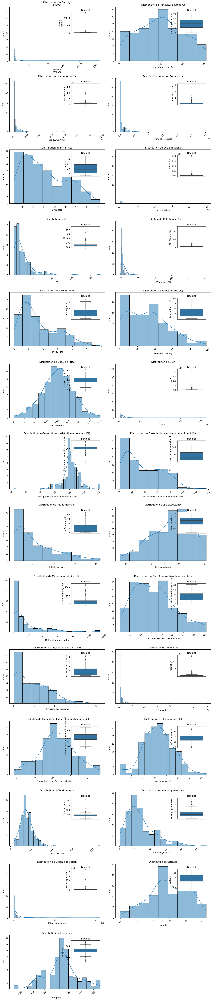


Statistiques descriptives :
       Density\n(P/Km2)  Agricultural Land( %)  Land Area(Km2)  \
count        194.000000             194.000000    1.940000e+02   
mean         357.427835              39.108454    6.902407e+05   
std         1987.997630              21.458930    1.921406e+06   
min            2.000000               0.600000    0.000000e+00   
25%           35.250000              22.425000    2.586925e+04   
50%           88.000000              39.850000    1.205380e+05   
75%          214.000000              54.925000    5.242560e+05   
max        26337.000000              82.600000    1.709824e+07   

       Armed Forces size  Birth Rate  Co2-Emissions         CPI  \
count       1.940000e+02  194.000000   1.940000e+02  194.000000   
mean        1.420485e+05   20.192371   1.761750e+05  144.593052   
std         3.605886e+05    9.859918   8.271358e+05   53.319078   
min         0.000000e+00    5.900000   1.100000e+01   99.030000   
25%         7.250000e+03   11.325000   2.

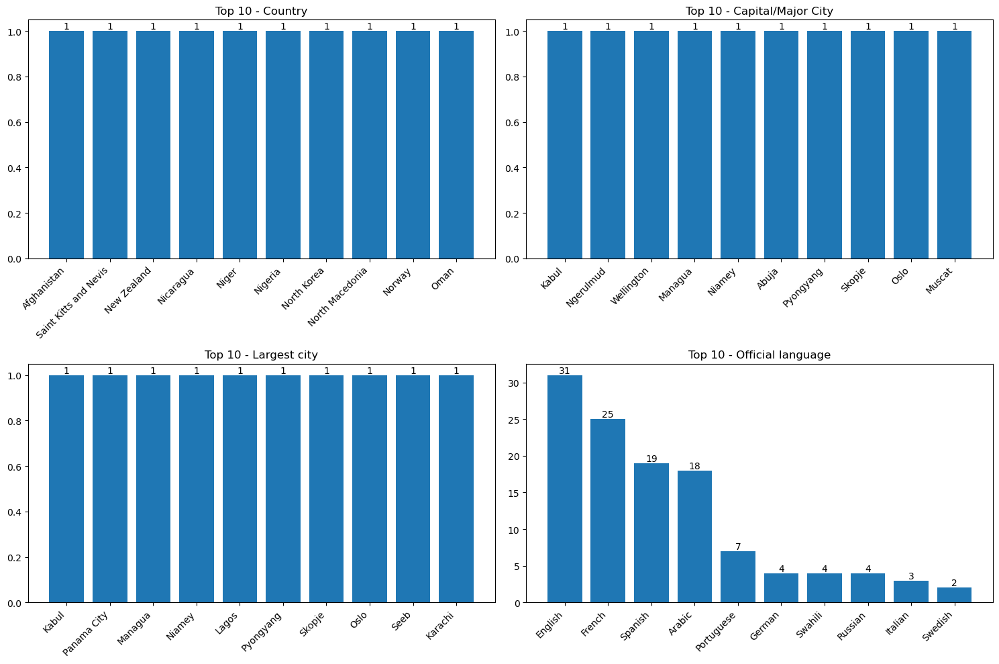


Proportion des catégories :

Country:
Country
Afghanistan              0.5%
Saint Kitts and Nevis    0.5%
New Zealand              0.5%
Nicaragua                0.5%
Niger                    0.5%
Nigeria                  0.5%
North Korea              0.5%
North Macedonia          0.5%
Norway                   0.5%
Oman                     0.5%
Name: proportion, dtype: object

Capital/Major City:
Capital/Major City
Kabul         0.5%
Ngerulmud     0.5%
Wellington    0.5%
Managua       0.5%
Niamey        0.5%
Abuja         0.5%
Pyongyang     0.5%
Skopje        0.5%
Oslo          0.5%
Muscat        0.5%
Name: proportion, dtype: object

Largest city:
Largest city
Kabul          0.5%
Panama City    0.5%
Managua        0.5%
Niamey         0.5%
Lagos          0.5%
Pyongyang      0.5%
Skopje         0.5%
Oslo           0.5%
Seeb           0.5%
Karachi        0.5%
Name: proportion, dtype: object

Official language:
Official language
English       16.3%
French        13.2%
Spanish       10.0%
A

In [30]:
visualiser_variables_cote_a_cote(data_clean)

=== Analyse entre variables numériques ===


,Density (P/Km2),Agricultural Land( %),Land Area(Km2),Armed Forces size,Birth Rate,Co2-Emissions,CPI,CPI Change (%),Fertility Rate,Forested Area (%),Gasoline Price,GDP,Gross primary education enrollment (%),Gross tertiary education enrollment (%),Infant mortality,Life expectancy,Maternal mortality ratio,Out of pocket health expenditure,Physicians per thousand,Population,Population: Labor force participation (%),Tax revenue (%),Total tax rate,Unemployment rate,Urban_population,Latitude,Longitude
Density (P/Km2),1.000,-0.020,-0.054,-0.026,-0.151,-0.019,0.050,-0.020,-0.012,-0.075,0.227,-0.019,0.049,0.005,-0.109,0.044,0.017,-0.096,0.209,-0.018,-0.011,0.003,-0.015,0.006,-0.024,0.065,0.032
Agricultural Land( %),-0.020,1.000,-0.031,0.044,0.197,0.064,0.173,-0.003,0.181,-0.438,0.040,0.052,-0.048,-0.110,0.204,-0.242,0.198,0.133,-0.034,0.118,-0.115,-0.052,0.171,0.062,0.102,-0.032,-0.015
Land Area(Km2),-0.054,-0.031,1.000,0.559,-0.065,0.589,0.082,0.036,-0.066,-0.015,-0.196,0.551,0.007,0.224,-0.068,0.061,-0.057,-0.011,0.070,0.447,-0.002,-0.169,0.085,0.040,0.547,0.048,0.010
Armed Forces size,-0.026,0.044,0.559,1.000,-0.130,0.742,0.144,0.064,-0.143,-0.045,-0.177,0.608,0.050,0.119,-0.073,0.081,-0.100,0.170,0.020,0.877,-0.073,-0.193,0.084,-0.026,0.852,0.130,0.169
Birth Rate,-0.151,0.197,-0.065,-0.130,1.000,-0.151,0.242,0.105,0.969,-0.078,-0.204,-0.180,-0.092,-0.706,0.868,-0.853,0.729,0.255,-0.740,-0.052,0.164,-0.348,0.197,-0.058,-0.106,-0.492,0.047
Co2-Emissions,-0.019,0.064,0.589,0.742,-0.151,1.000,0.002,-0.004,-0.141,-0.028,-0.075,0.915,0.003,0.160,-0.123,0.123,-0.110,-0.031,0.053,0.808,-0.014,-0.147,0.059,0.010,0.924,0.116,0.072
CPI,0.050,0.173,0.082,0.144,0.242,0.002,1.000,0.299,0.208,-0.089,-0.204,-0.060,0.147,-0.160,0.235,-0.281,0.220,0.116,-0.163,0.081,-0.026,-0.235,0.064,0.049,0.066,-0.161,0.007
CPI Change (%),-0.020,-0.003,0.036,0.064,0.105,-0.004,0.299,1.000,0.095,-0.011,-0.256,-0.010,-0.139,0.027,0.156,-0.147,0.222,0.137,-0.042,0.007,-0.013,-0.095,0.114,0.109,0.009,-0.092,-0.080
Fertility Rate,-0.012,0.181,-0.066,-0.143,0.969,-0.141,0.208,0.095,1.000,-0.073,-0.112,-0.161,-0.146,-0.673,0.848,-0.838,0.755,0.197,-0.659,-0.056,0.146,-0.343,0.210,-0.079,-0.105,-0.442,0.044
Forested Area (%),-0.075,-0.438,-0.015,-0.045,-0.078,-0.028,-0.089,-0.011,-0.073,1.000,0.149,-0.000,0.139,-0.011,-0.055,0.006,-0.080,-0.245,-0.086,-0.055,0.114,0.123,0.034,-0.082,-0.034,-0.153,0.047



Corrélations significatives (|corr| > 0.5) :


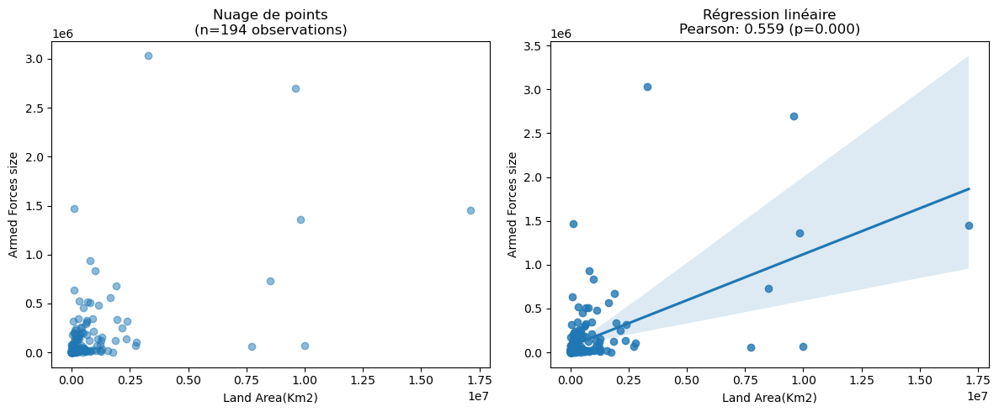

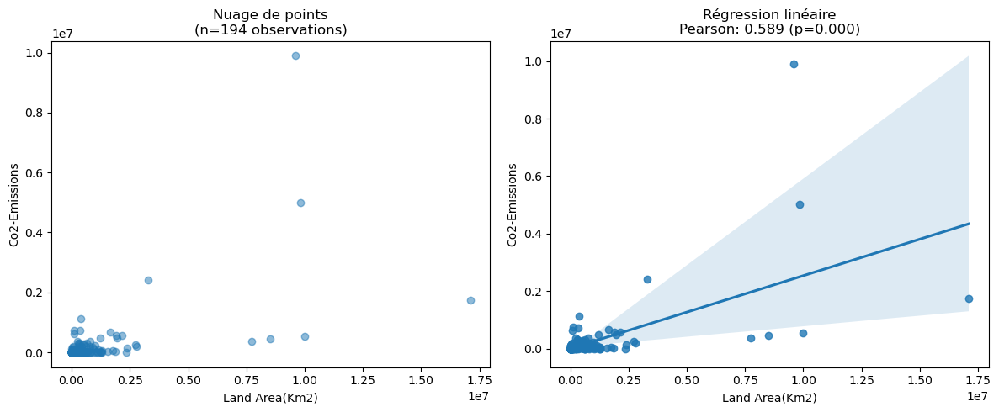

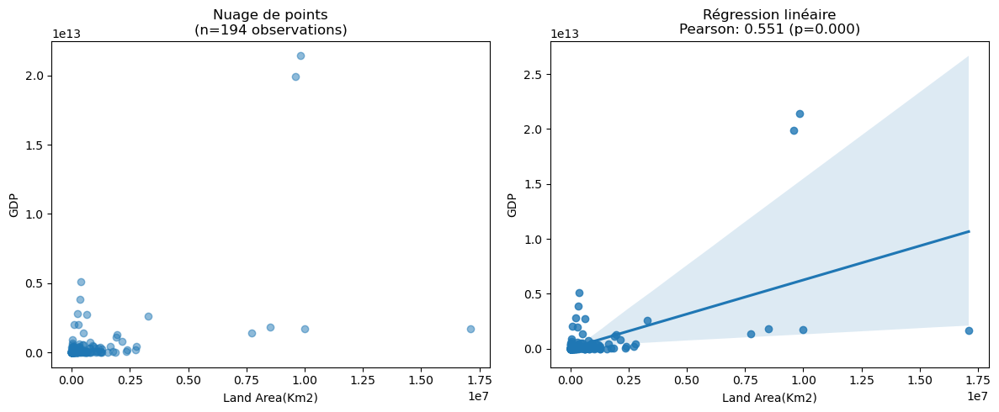

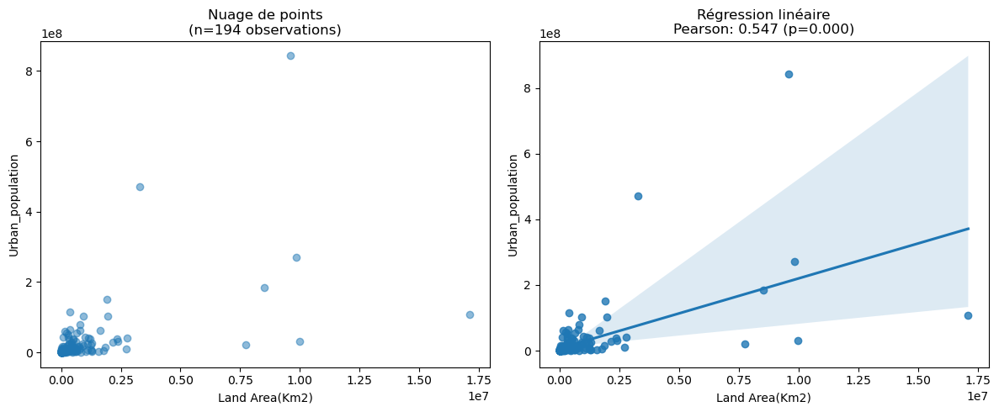

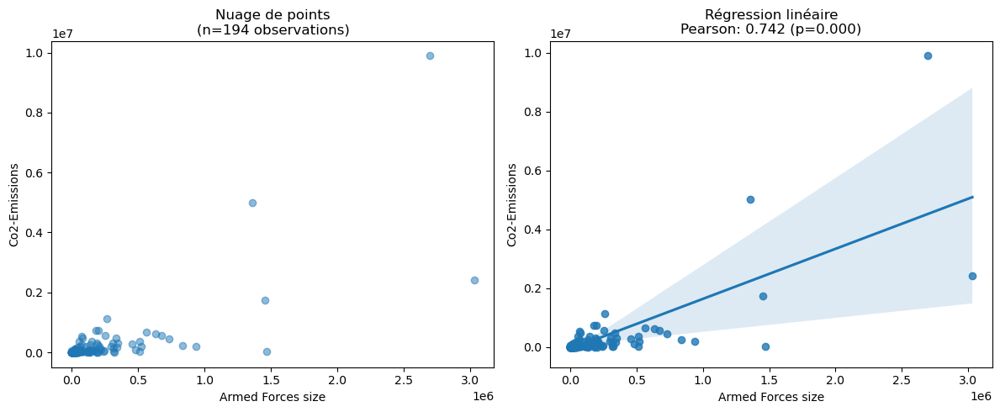

...

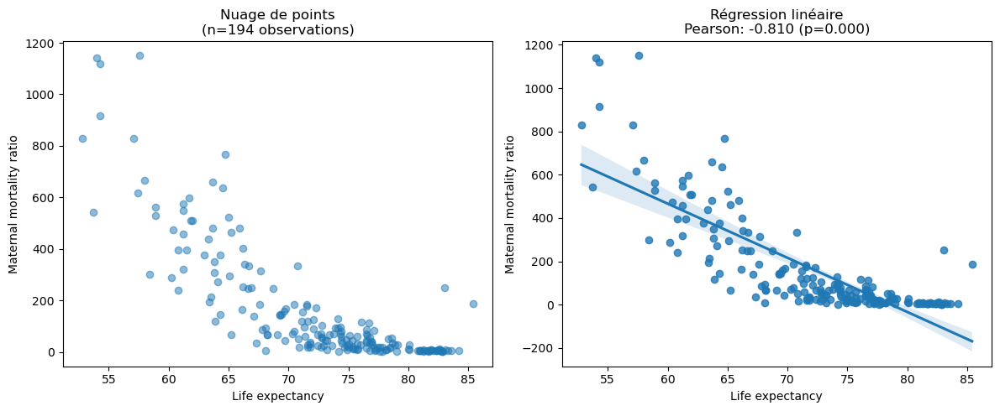

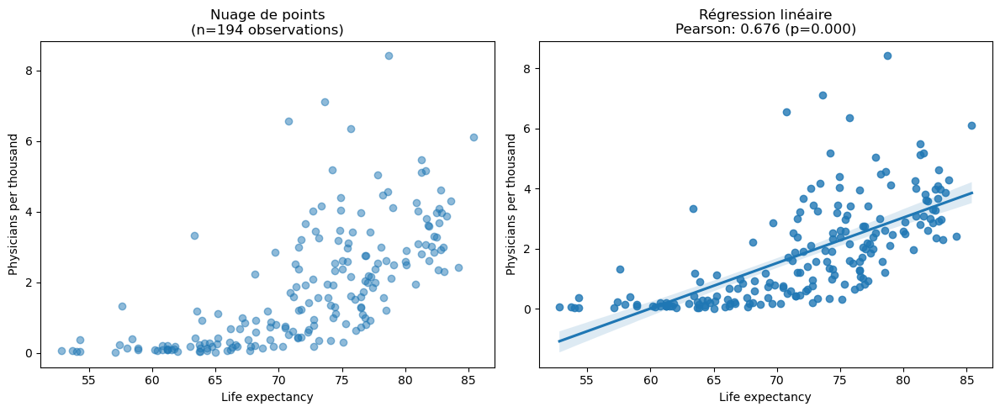

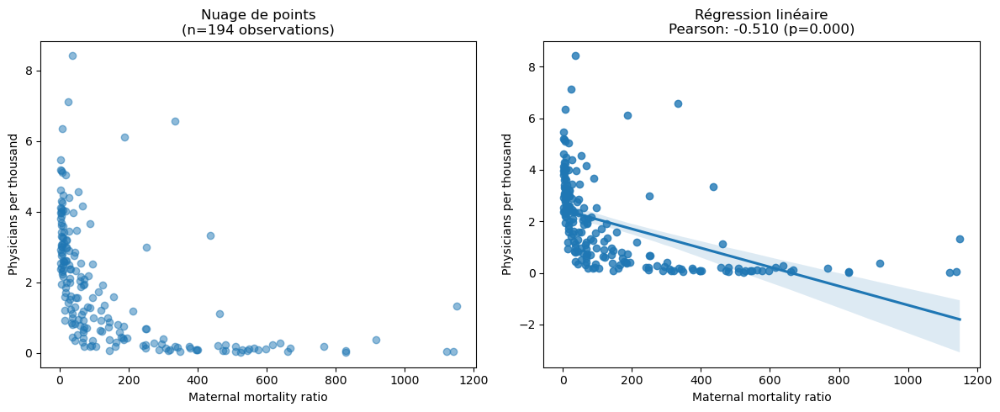

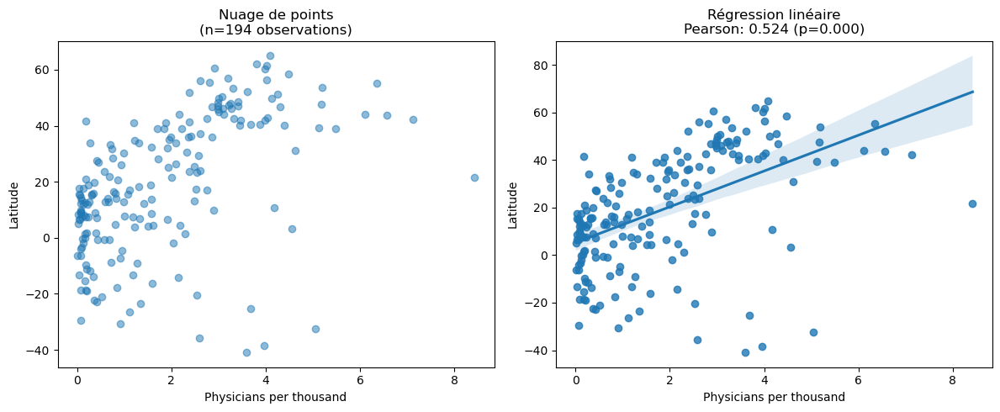

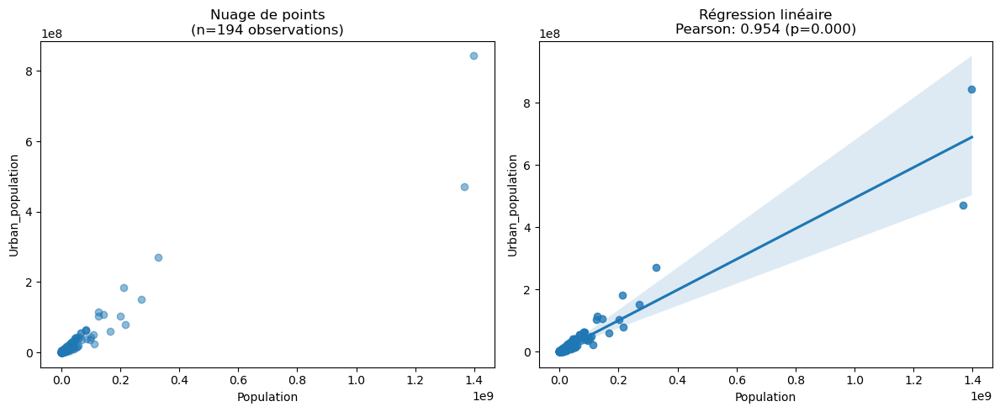

,Variable 1,Variable 2,Corrélation Pearson,P-value Pearson,Corrélation Spearman,P-value Spearman,Nombre observations
0,Land Area(Km2),Armed Forces size,0.559,2.398e-17,0.654,4.798e-25,194
1,Land Area(Km2),Co2-Emissions,0.589,1.539e-19,0.599,2.889e-20,194
2,Land Area(Km2),GDP,0.551,8.872e-17,0.571,3.291e-18,194
3,Land Area(Km2),Urban_population,0.547,1.458e-16,0.755,5.045e-37,194
4,Armed Forces size,Co2-Emissions,0.742,3.847e-35,0.781,3.992e-41,194
5,Armed Forces size,GDP,0.608,5.001e-21,0.752,1.480e-36,194
6,Armed Forces size,Population,0.877,7.013e-63,0.837,3.081e-52,194
7,Armed Forces size,Urban_population,0.852,6.382e-56,0.825,1.484e-49,194
8,Birth Rate,Fertility Rate,0.969,3.776e-119,0.962,1.143e-109,194
9,Birth Rate,Gross tertiary education enrollment (%),-0.706,1.539e-30,-0.757,2.204e-37,194



Conclusions des tests statistiques :

Land Area(Km2) vs Armed Forces size:
- Corrélation de Pearson : 0.559
  → Significatif (p=2.398e-17)
- Corrélation de Spearman : 0.654
  → Significatif (p=4.798e-25)

Land Area(Km2) vs Co2-Emissions:
- Corrélation de Pearson : 0.589
  → Significatif (p=1.539e-19)
- Corrélation de Spearman : 0.599
  → Significatif (p=2.889e-20)

Land Area(Km2) vs GDP:
- Corrélation de Pearson : 0.551
  → Significatif (p=8.872e-17)
- Corrélation de Spearman : 0.571
  → Significatif (p=3.291e-18)

Land Area(Km2) vs Urban_population:
- Corrélation de Pearson : 0.547
  → Significatif (p=1.458e-16)
- Corrélation de Spearman : 0.755
  → Significatif (p=5.045e-37)

Armed Forces size vs Co2-Emissions:
- Corrélation de Pearson : 0.742
  → Significatif (p=3.847e-35)
- Corrélation de Spearman : 0.781
  → Significatif (p=3.992e-41)

Armed Forces size vs GDP:
- Corrélation de Pearson : 0.608
  → Significatif (p=5.001e-21)
- Corrélation de Spearman : 0.752
  → Significatif (p=1.

In [31]:
analyse_bivariee(data_clean)


Analyse pour les 5 premiers pays


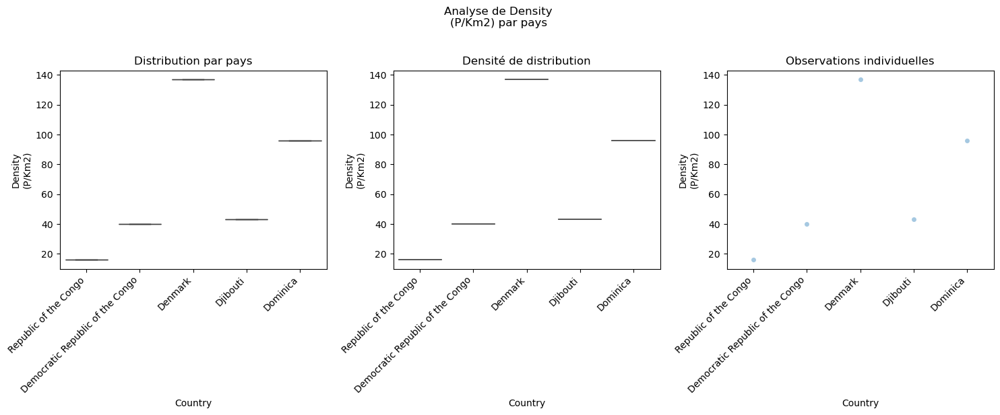


Statistiques descriptives pour Density
(P/Km2):

Par pays :
                                  Nombre  Moyenne  Minimum  Maximum
Country                                                            
Democratic Republic of the Congo       1     40.0     40.0     40.0
Denmark                                1    137.0    137.0    137.0
Djibouti                               1     43.0     43.0     43.0
Dominica                               1     96.0     96.0     96.0
Republic of the Congo                  1     16.0     16.0     16.0

Statistiques globales :
Moyenne globale       66.4
Médiane globale       43.0
Écart-type global     49.1
Minimum global        16.0
Maximum global       137.0
dtype: float64

Test de Kruskal-Wallis:
p-value = 0.4060

Conclusion:
✓ Pas de différence significative entre les pays pour Density
(P/Km2)
→ La distribution est similaire entre les pays
→ Les variations observées sont probablement dues au hasard

Democratic Republic of the Congo:
- Valeur: 40.00
- Éca

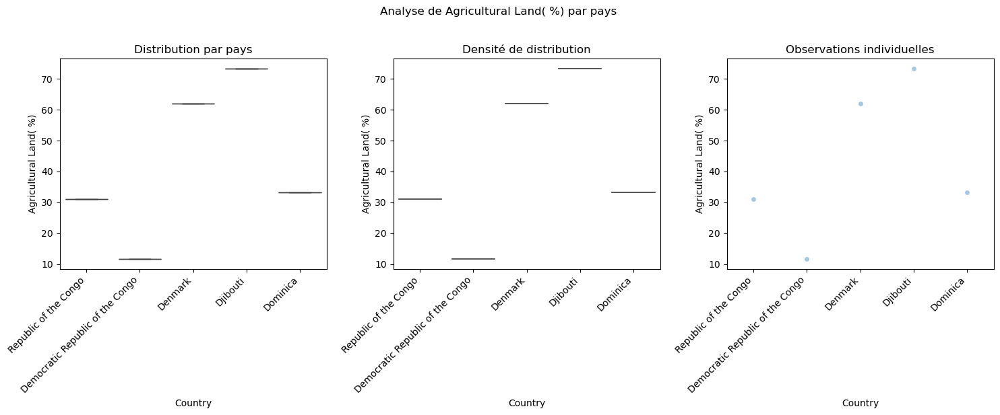


Statistiques descriptives pour Agricultural Land( %):

Par pays :
                                  Nombre  Moyenne  Minimum  Maximum
Country                                                            
Democratic Republic of the Congo       1     11.6     11.6     11.6
Denmark                                1     62.0     62.0     62.0
Djibouti                               1     73.4     73.4     73.4
Dominica                               1     33.3     33.3     33.3
Republic of the Congo                  1     31.1     31.1     31.1

Statistiques globales :
Moyenne globale      42.28
Médiane globale      33.30
Écart-type global    25.02
Minimum global       11.60
Maximum global       73.40
dtype: float64

Test de Kruskal-Wallis:
p-value = 0.4060

Conclusion:
✓ Pas de différence significative entre les pays pour Agricultural Land( %)
→ La distribution est similaire entre les pays
→ Les variations observées sont probablement dues au hasard

Democratic Republic of the Congo:
- Valeur:

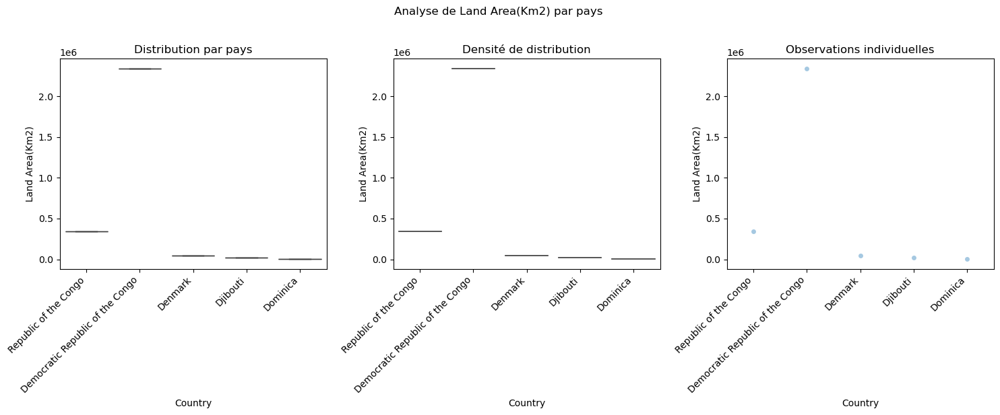


Statistiques descriptives pour Land Area(Km2):

Par pays :
                                  Nombre    Moyenne    Minimum    Maximum
Country                                                                  
Democratic Republic of the Congo       1  2344858.0  2344858.0  2344858.0
Denmark                                1    43094.0    43094.0    43094.0
Djibouti                               1    23200.0    23200.0    23200.0
Dominica                               1      751.0      751.0      751.0
Republic of the Congo                  1   342000.0   342000.0   342000.0

Statistiques globales :
Moyenne globale       550780.60
Médiane globale        43094.00
Écart-type global    1012536.74
Minimum global           751.00
Maximum global       2344858.00
dtype: float64

Test de Kruskal-Wallis:
p-value = 0.4060

Conclusion:
✓ Pas de différence significative entre les pays pour Land Area(Km2)
→ La distribution est similaire entre les pays
→ Les variations observées sont probablement dues a

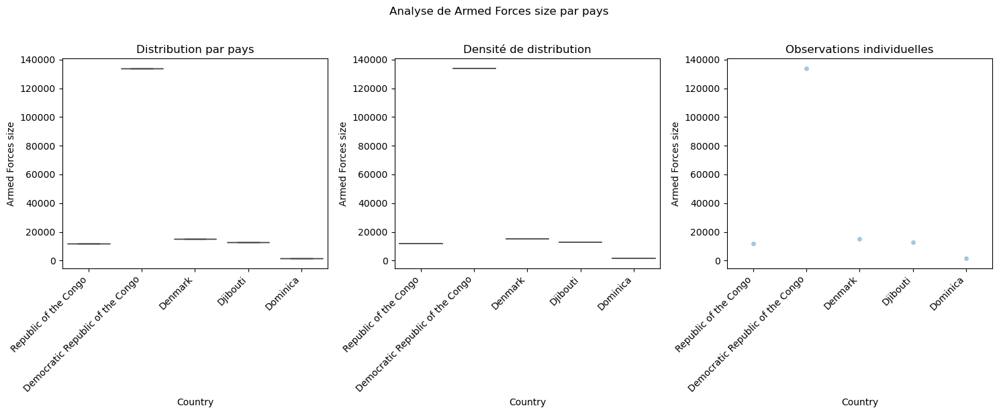


Statistiques descriptives pour Armed Forces size:

Par pays :
                                  Nombre   Moyenne   Minimum   Maximum
Country                                                               
Democratic Republic of the Congo       1  134000.0  134000.0  134000.0
Denmark                                1   15000.0   15000.0   15000.0
Djibouti                               1   13000.0   13000.0   13000.0
Dominica                               1    1400.0    1400.0    1400.0
Republic of the Congo                  1   12000.0   12000.0   12000.0

Statistiques globales :
Moyenne globale       35080.00
Médiane globale       13000.00
Écart-type global     55549.37
Minimum global         1400.00
Maximum global       134000.00
dtype: float64

Test de Kruskal-Wallis:
p-value = 0.4060

Conclusion:
✓ Pas de différence significative entre les pays pour Armed Forces size
→ La distribution est similaire entre les pays
→ Les variations observées sont probablement dues au hasard

Democratic

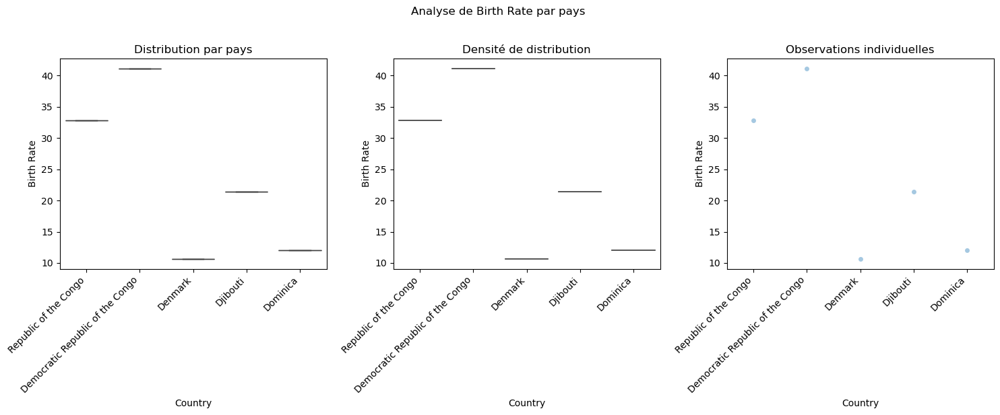


Statistiques descriptives pour Birth Rate:

Par pays :
                                  Nombre  Moyenne  Minimum  Maximum
Country                                                            
Democratic Republic of the Congo       1    41.18    41.18    41.18
Denmark                                1    10.60    10.60    10.60
Djibouti                               1    21.47    21.47    21.47
Dominica                               1    12.00    12.00    12.00
Republic of the Congo                  1    32.86    32.86    32.86

Statistiques globales :
Moyenne globale      23.62
Médiane globale      21.47
Écart-type global    13.26
Minimum global       10.60
Maximum global       41.18
dtype: float64

Test de Kruskal-Wallis:
p-value = 0.4060

Conclusion:
✓ Pas de différence significative entre les pays pour Birth Rate
→ La distribution est similaire entre les pays
→ Les variations observées sont probablement dues au hasard

Democratic Republic of the Congo:
- Valeur: 41.18
- Écart à la mo

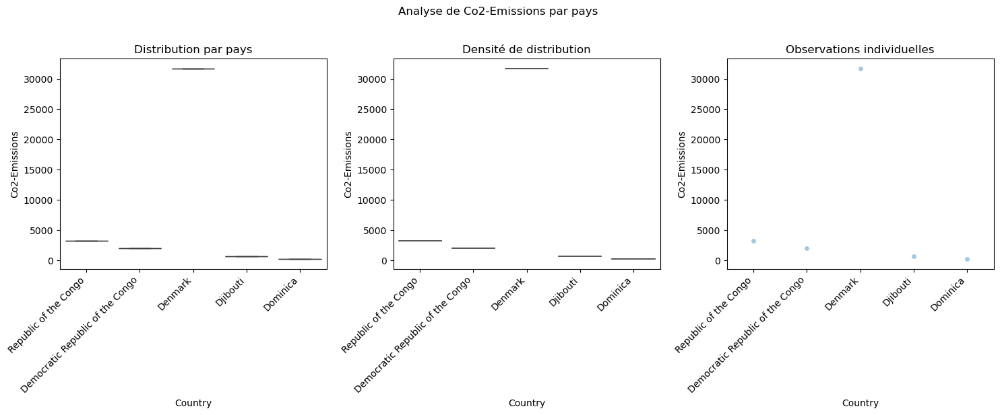


Statistiques descriptives pour Co2-Emissions:

Par pays :
                                  Nombre  Moyenne  Minimum  Maximum
Country                                                            
Democratic Republic of the Congo       1   2021.0   2021.0   2021.0
Denmark                                1  31786.0  31786.0  31786.0
Djibouti                               1    620.0    620.0    620.0
Dominica                               1    180.0    180.0    180.0
Republic of the Congo                  1   3282.0   3282.0   3282.0

Statistiques globales :
Moyenne globale       7577.80
Médiane globale       2021.00
Écart-type global    13587.75
Minimum global         180.00
Maximum global       31786.00
dtype: float64

Test de Kruskal-Wallis:
p-value = 0.4060

Conclusion:
✓ Pas de différence significative entre les pays pour Co2-Emissions
→ La distribution est similaire entre les pays
→ Les variations observées sont probablement dues au hasard

Democratic Republic of the Congo:
- Valeur: 

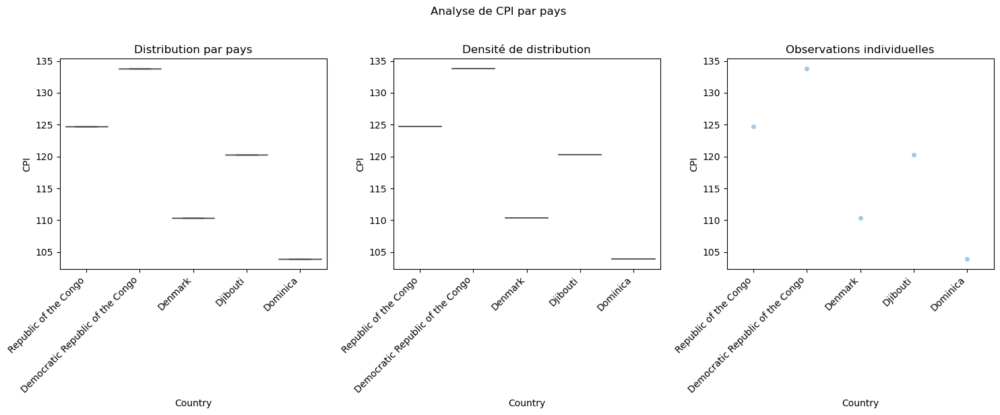


Statistiques descriptives pour CPI:

Par pays :
                                  Nombre  Moyenne  Minimum  Maximum
Country                                                            
Democratic Republic of the Congo       1   133.85   133.85   133.85
Denmark                                1   110.35   110.35   110.35
Djibouti                               1   120.25   120.25   120.25
Dominica                               1   103.87   103.87   103.87
Republic of the Congo                  1   124.74   124.74   124.74

Statistiques globales :
Moyenne globale      118.61
Médiane globale      120.25
Écart-type global     11.81
Minimum global       103.87
Maximum global       133.85
dtype: float64

Test de Kruskal-Wallis:
p-value = 0.4060

Conclusion:
✓ Pas de différence significative entre les pays pour CPI
→ La distribution est similaire entre les pays
→ Les variations observées sont probablement dues au hasard

Democratic Republic of the Congo:
- Valeur: 133.85
- Écart à la moyenne: +

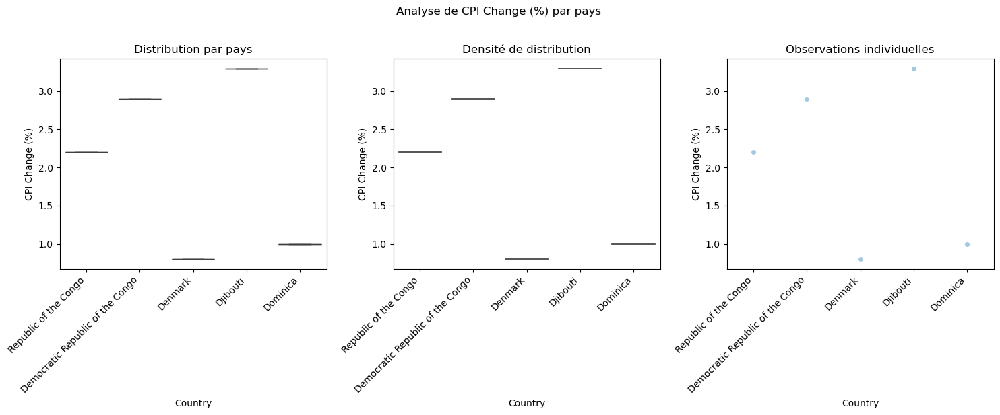


Statistiques descriptives pour CPI Change (%):

Par pays :
                                  Nombre  Moyenne  Minimum  Maximum
Country                                                            
Democratic Republic of the Congo       1      2.9      2.9      2.9
Denmark                                1      0.8      0.8      0.8
Djibouti                               1      3.3      3.3      3.3
Dominica                               1      1.0      1.0      1.0
Republic of the Congo                  1      2.2      2.2      2.2

Statistiques globales :
Moyenne globale      2.04
Médiane globale      2.20
Écart-type global    1.11
Minimum global       0.80
Maximum global       3.30
dtype: float64

Test de Kruskal-Wallis:
p-value = 0.4060

Conclusion:
✓ Pas de différence significative entre les pays pour CPI Change (%)
→ La distribution est similaire entre les pays
→ Les variations observées sont probablement dues au hasard

Democratic Republic of the Congo:
- Valeur: 2.90
- Écart à la 

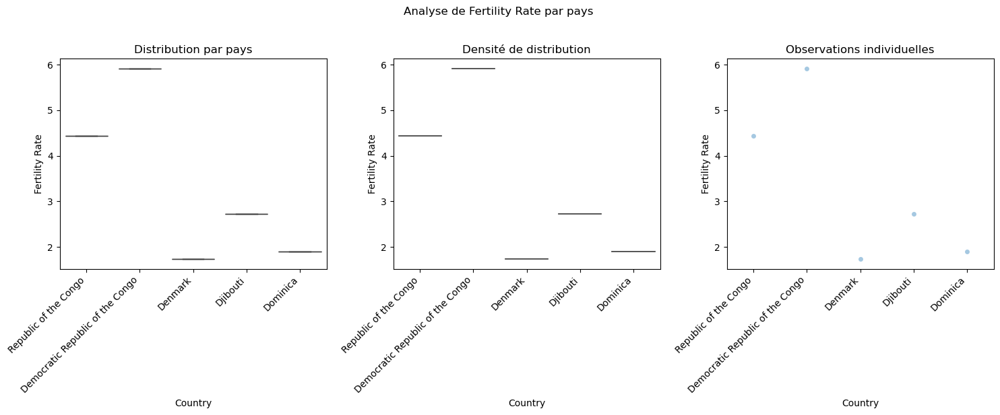


Statistiques descriptives pour Fertility Rate:

Par pays :
                                  Nombre  Moyenne  Minimum  Maximum
Country                                                            
Democratic Republic of the Congo       1     5.92     5.92     5.92
Denmark                                1     1.73     1.73     1.73
Djibouti                               1     2.73     2.73     2.73
Dominica                               1     1.90     1.90     1.90
Republic of the Congo                  1     4.43     4.43     4.43

Statistiques globales :
Moyenne globale      3.34
Médiane globale      2.73
Écart-type global    1.79
Minimum global       1.73
Maximum global       5.92
dtype: float64

Test de Kruskal-Wallis:
p-value = 0.4060

Conclusion:
✓ Pas de différence significative entre les pays pour Fertility Rate
→ La distribution est similaire entre les pays
→ Les variations observées sont probablement dues au hasard

Democratic Republic of the Congo:
- Valeur: 5.92
- Écart à la 

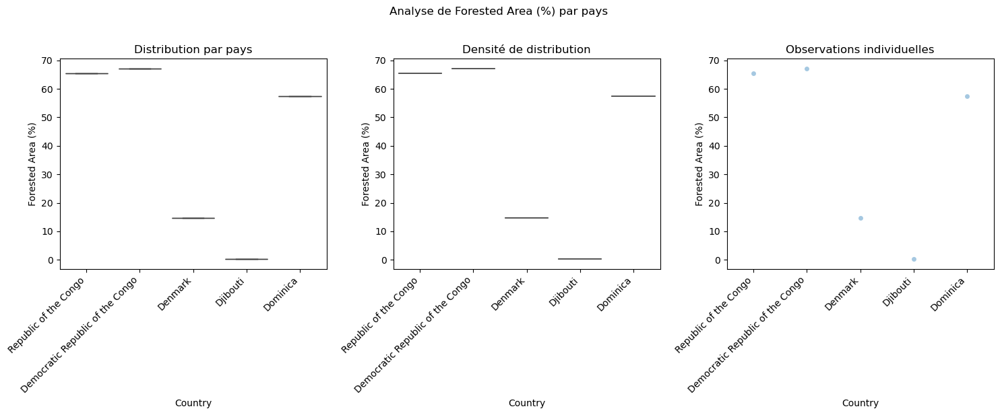


Statistiques descriptives pour Forested Area (%):

Par pays :
                                  Nombre  Moyenne  Minimum  Maximum
Country                                                            
Democratic Republic of the Congo       1     67.2     67.2     67.2
Denmark                                1     14.7     14.7     14.7
Djibouti                               1      0.2      0.2      0.2
Dominica                               1     57.4     57.4     57.4
Republic of the Congo                  1     65.4     65.4     65.4

Statistiques globales :
Moyenne globale      40.98
Médiane globale      57.40
Écart-type global    31.25
Minimum global        0.20
Maximum global       67.20
dtype: float64

Test de Kruskal-Wallis:
p-value = 0.4060

Conclusion:
✓ Pas de différence significative entre les pays pour Forested Area (%)
→ La distribution est similaire entre les pays
→ Les variations observées sont probablement dues au hasard

Democratic Republic of the Congo:
- Valeur: 67.20
-

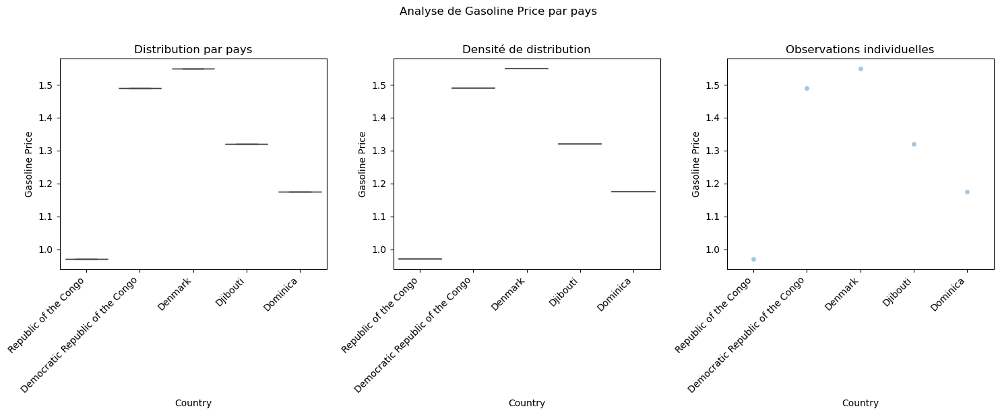


Statistiques descriptives pour Gasoline Price:

Par pays :
                                  Nombre  Moyenne  Minimum  Maximum
Country                                                            
Democratic Republic of the Congo       1     1.49     1.49     1.49
Denmark                                1     1.55     1.55     1.55
Djibouti                               1     1.32     1.32     1.32
Dominica                               1     1.18     1.18     1.18
Republic of the Congo                  1     0.97     0.97     0.97

Statistiques globales :
Moyenne globale      1.30
Médiane globale      1.32
Écart-type global    0.24
Minimum global       0.97
Maximum global       1.55
dtype: float64

Test de Kruskal-Wallis:
p-value = 0.4060

Conclusion:
✓ Pas de différence significative entre les pays pour Gasoline Price
→ La distribution est similaire entre les pays
→ Les variations observées sont probablement dues au hasard

Democratic Republic of the Congo:
- Valeur: 1.49
- Écart à la 

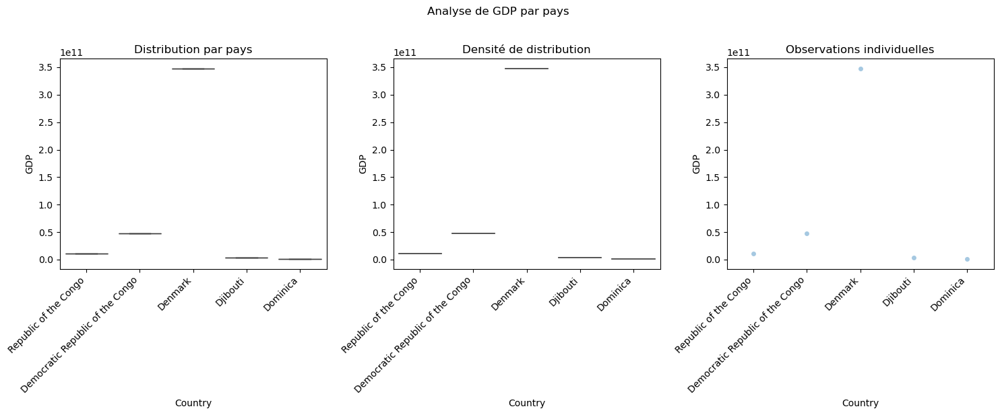


Statistiques descriptives pour GDP:

Par pays :
                                  Nombre       Moyenne       Minimum  \
Country                                                                
Democratic Republic of the Congo       1  4.731962e+10  4.731962e+10   
Denmark                                1  3.480780e+11  3.480780e+11   
Djibouti                               1  3.318716e+09  3.318716e+09   
Dominica                               1  5.960333e+08  5.960333e+08   
Republic of the Congo                  1  1.082059e+10  1.082059e+10   

                                       Maximum  
Country                                         
Democratic Republic of the Congo  4.731962e+10  
Denmark                           3.480780e+11  
Djibouti                          3.318716e+09  
Dominica                          5.960333e+08  
Republic of the Congo             1.082059e+10  

Statistiques globales :
Moyenne globale      8.202660e+10
Médiane globale      1.082059e+10
Écart-type

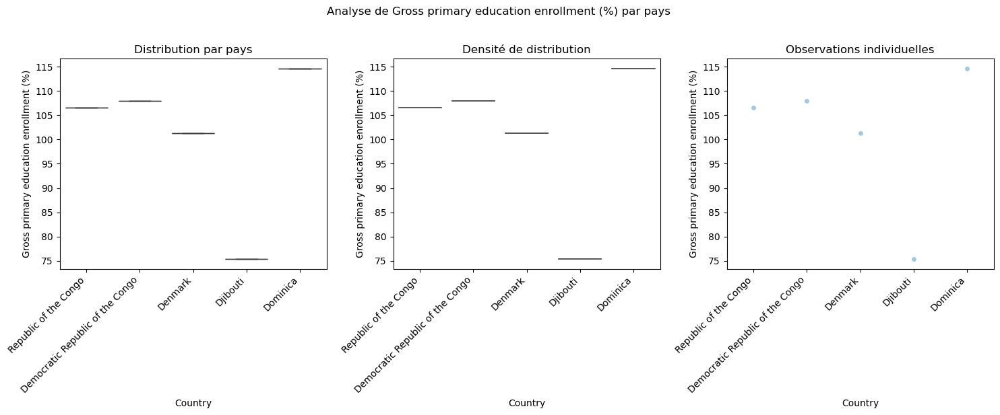


Statistiques descriptives pour Gross primary education enrollment (%):

Par pays :
                                  Nombre  Moyenne  Minimum  Maximum
Country                                                            
Democratic Republic of the Congo       1    108.0    108.0    108.0
Denmark                                1    101.3    101.3    101.3
Djibouti                               1     75.3     75.3     75.3
Dominica                               1    114.7    114.7    114.7
Republic of the Congo                  1    106.6    106.6    106.6

Statistiques globales :
Moyenne globale      101.18
Médiane globale      106.60
Écart-type global     15.24
Minimum global        75.30
Maximum global       114.70
dtype: float64

Test de Kruskal-Wallis:
p-value = 0.4060

Conclusion:
✓ Pas de différence significative entre les pays pour Gross primary education enrollment (%)
→ La distribution est similaire entre les pays
→ Les variations observées sont probablement dues au hasard

Demo

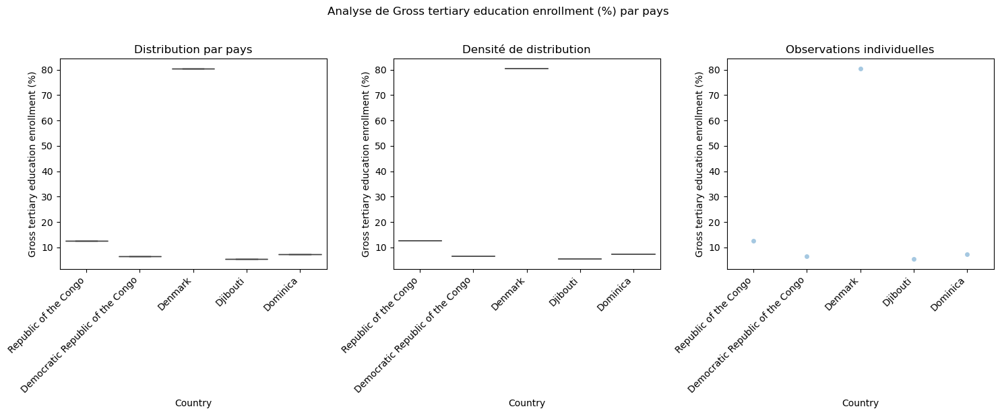


Statistiques descriptives pour Gross tertiary education enrollment (%):

Par pays :
                                  Nombre  Moyenne  Minimum  Maximum
Country                                                            
Democratic Republic of the Congo       1      6.6      6.6      6.6
Denmark                                1     80.6     80.6     80.6
Djibouti                               1      5.3      5.3      5.3
Dominica                               1      7.2      7.2      7.2
Republic of the Congo                  1     12.7     12.7     12.7

Statistiques globales :
Moyenne globale      22.48
Médiane globale       7.20
Écart-type global    32.61
Minimum global        5.30
Maximum global       80.60
dtype: float64

Test de Kruskal-Wallis:
p-value = 0.4060

Conclusion:
✓ Pas de différence significative entre les pays pour Gross tertiary education enrollment (%)
→ La distribution est similaire entre les pays
→ Les variations observées sont probablement dues au hasard

Democra

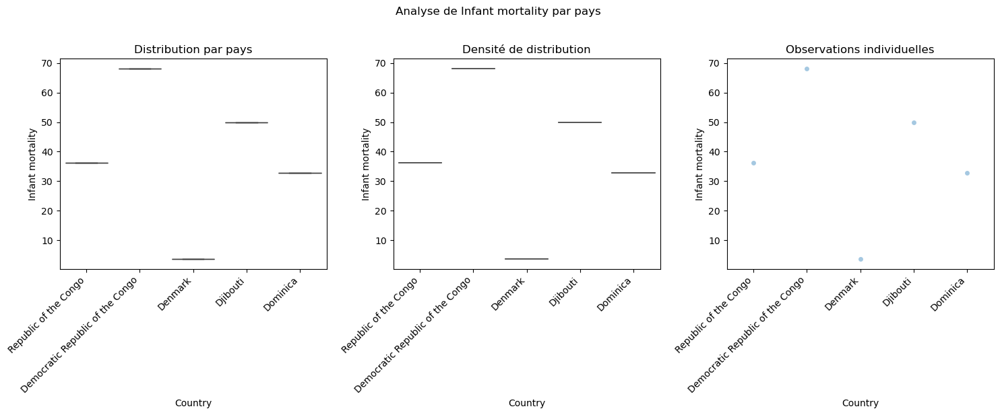


Statistiques descriptives pour Infant mortality:

Par pays :
                                  Nombre  Moyenne  Minimum  Maximum
Country                                                            
Democratic Republic of the Congo       1     68.2     68.2     68.2
Denmark                                1      3.6      3.6      3.6
Djibouti                               1     49.8     49.8     49.8
Dominica                               1     32.9     32.9     32.9
Republic of the Congo                  1     36.2     36.2     36.2

Statistiques globales :
Moyenne globale      38.14
Médiane globale      36.20
Écart-type global    23.79
Minimum global        3.60
Maximum global       68.20
dtype: float64

Test de Kruskal-Wallis:
p-value = 0.4060

Conclusion:
✓ Pas de différence significative entre les pays pour Infant mortality
→ La distribution est similaire entre les pays
→ Les variations observées sont probablement dues au hasard

Democratic Republic of the Congo:
- Valeur: 68.20
- É

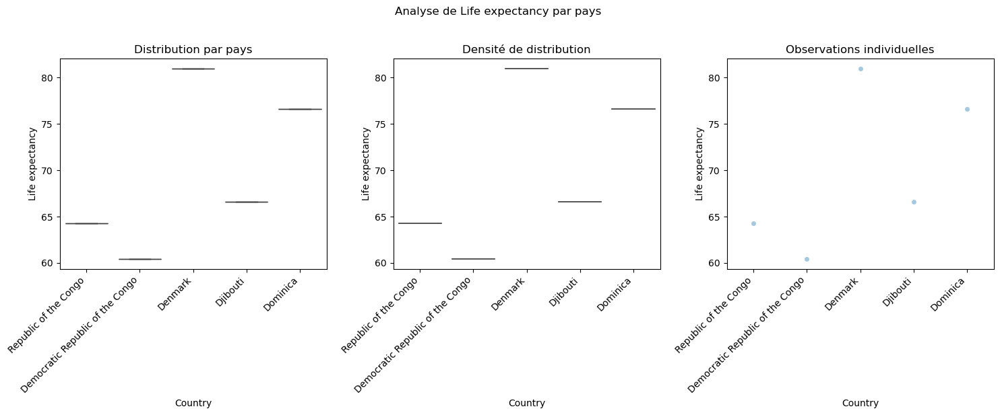


Statistiques descriptives pour Life expectancy:

Par pays :
                                  Nombre  Moyenne  Minimum  Maximum
Country                                                            
Democratic Republic of the Congo       1     60.4     60.4     60.4
Denmark                                1     81.0     81.0     81.0
Djibouti                               1     66.6     66.6     66.6
Dominica                               1     76.6     76.6     76.6
Republic of the Congo                  1     64.3     64.3     64.3

Statistiques globales :
Moyenne globale      69.78
Médiane globale      66.60
Écart-type global     8.67
Minimum global       60.40
Maximum global       81.00
dtype: float64

Test de Kruskal-Wallis:
p-value = 0.4060

Conclusion:
✓ Pas de différence significative entre les pays pour Life expectancy
→ La distribution est similaire entre les pays
→ Les variations observées sont probablement dues au hasard

Democratic Republic of the Congo:
- Valeur: 60.40
- Éca

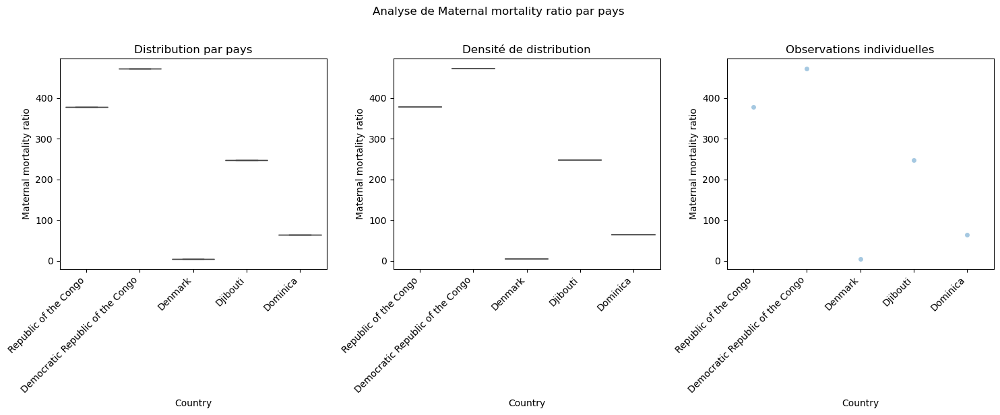


Statistiques descriptives pour Maternal mortality ratio:

Par pays :
                                  Nombre  Moyenne  Minimum  Maximum
Country                                                            
Democratic Republic of the Congo       1    473.0    473.0    473.0
Denmark                                1      4.0      4.0      4.0
Djibouti                               1    248.0    248.0    248.0
Dominica                               1     64.6     64.6     64.6
Republic of the Congo                  1    378.0    378.0    378.0

Statistiques globales :
Moyenne globale      233.52
Médiane globale      248.00
Écart-type global    199.78
Minimum global         4.00
Maximum global       473.00
dtype: float64

Test de Kruskal-Wallis:
p-value = 0.4060

Conclusion:
✓ Pas de différence significative entre les pays pour Maternal mortality ratio
→ La distribution est similaire entre les pays
→ Les variations observées sont probablement dues au hasard

Democratic Republic of the Congo

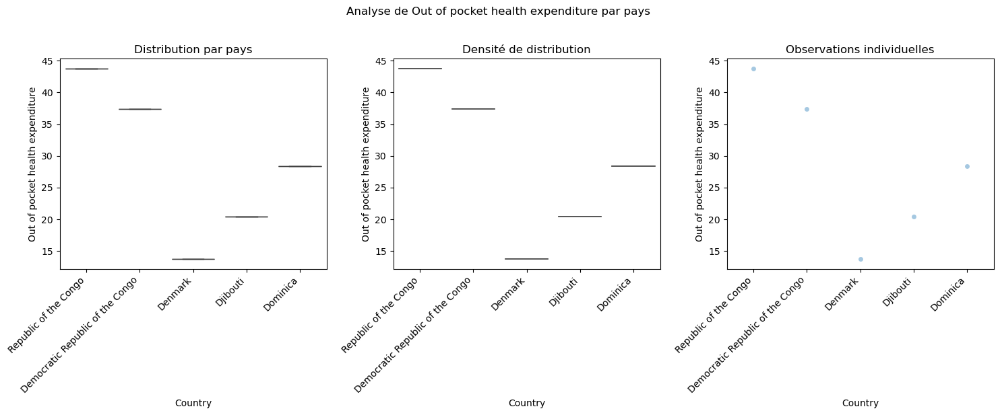


Statistiques descriptives pour Out of pocket health expenditure:

Par pays :
                                  Nombre  Moyenne  Minimum  Maximum
Country                                                            
Democratic Republic of the Congo       1     37.4     37.4     37.4
Denmark                                1     13.7     13.7     13.7
Djibouti                               1     20.4     20.4     20.4
Dominica                               1     28.4     28.4     28.4
Republic of the Congo                  1     43.8     43.8     43.8

Statistiques globales :
Moyenne globale      28.74
Médiane globale      28.40
Écart-type global    12.22
Minimum global       13.70
Maximum global       43.80
dtype: float64

Test de Kruskal-Wallis:
p-value = 0.4060

Conclusion:
✓ Pas de différence significative entre les pays pour Out of pocket health expenditure
→ La distribution est similaire entre les pays
→ Les variations observées sont probablement dues au hasard

Democratic Republic o

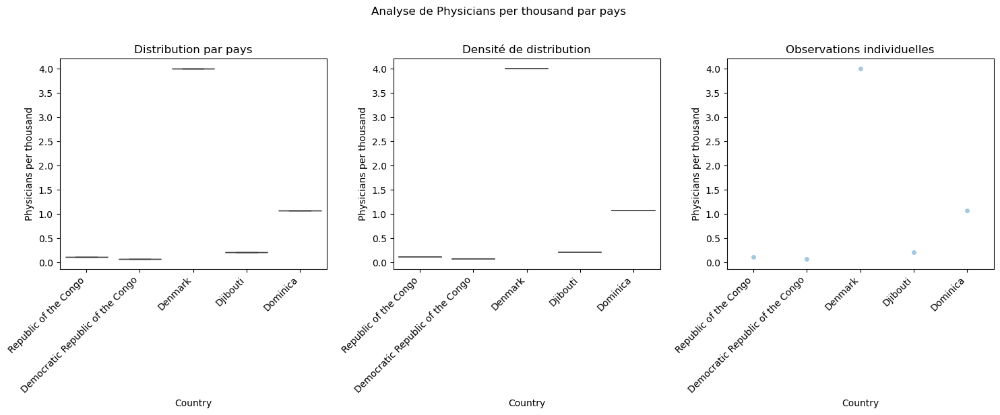


Statistiques descriptives pour Physicians per thousand:

Par pays :
                                  Nombre  Moyenne  Minimum  Maximum
Country                                                            
Democratic Republic of the Congo       1     0.07     0.07     0.07
Denmark                                1     4.01     4.01     4.01
Djibouti                               1     0.22     0.22     0.22
Dominica                               1     1.08     1.08     1.08
Republic of the Congo                  1     0.12     0.12     0.12

Statistiques globales :
Moyenne globale      1.10
Médiane globale      0.22
Écart-type global    1.68
Minimum global       0.07
Maximum global       4.01
dtype: float64

Test de Kruskal-Wallis:
p-value = 0.4060

Conclusion:
✓ Pas de différence significative entre les pays pour Physicians per thousand
→ La distribution est similaire entre les pays
→ Les variations observées sont probablement dues au hasard

Democratic Republic of the Congo:
- Valeur: 

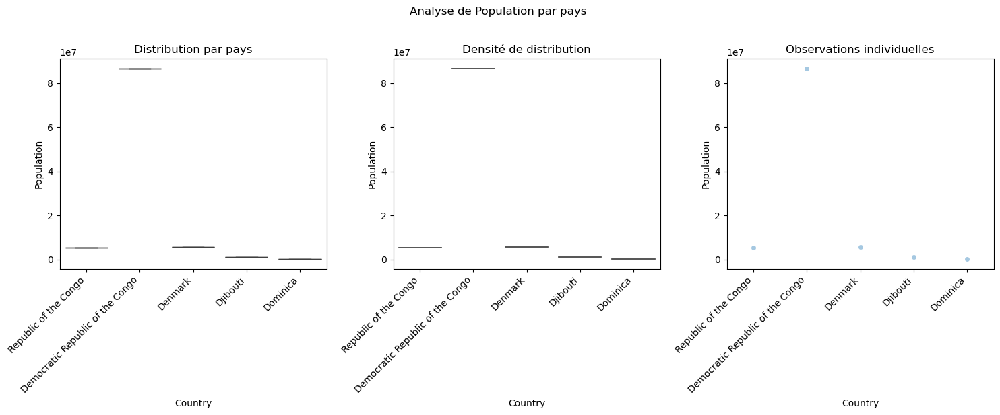


Statistiques descriptives pour Population:

Par pays :
                                  Nombre     Moyenne     Minimum     Maximum
Country                                                                     
Democratic Republic of the Congo       1  86790567.0  86790567.0  86790567.0
Denmark                                1   5818553.0   5818553.0   5818553.0
Djibouti                               1    973560.0    973560.0    973560.0
Dominica                               1     71808.0     71808.0     71808.0
Republic of the Congo                  1   5380508.0   5380508.0   5380508.0

Statistiques globales :
Moyenne globale      19806999.20
Médiane globale       5380508.00
Écart-type global    37532568.64
Minimum global          71808.00
Maximum global       86790567.00
dtype: float64

Test de Kruskal-Wallis:
p-value = 0.4060

Conclusion:
✓ Pas de différence significative entre les pays pour Population
→ La distribution est similaire entre les pays
→ Les variations observées sont p

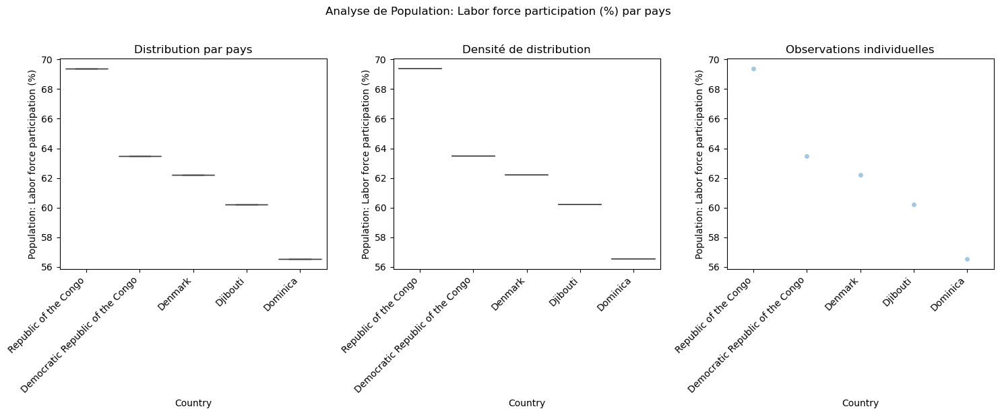


Statistiques descriptives pour Population: Labor force participation (%):

Par pays :
                                  Nombre  Moyenne  Minimum  Maximum
Country                                                            
Democratic Republic of the Congo       1    63.50    63.50    63.50
Denmark                                1    62.20    62.20    62.20
Djibouti                               1    60.20    60.20    60.20
Dominica                               1    56.52    56.52    56.52
Republic of the Congo                  1    69.40    69.40    69.40

Statistiques globales :
Moyenne globale      62.36
Médiane globale      62.20
Écart-type global     4.73
Minimum global       56.52
Maximum global       69.40
dtype: float64

Test de Kruskal-Wallis:
p-value = 0.4060

Conclusion:
✓ Pas de différence significative entre les pays pour Population: Labor force participation (%)
→ La distribution est similaire entre les pays
→ Les variations observées sont probablement dues au hasard

Dem

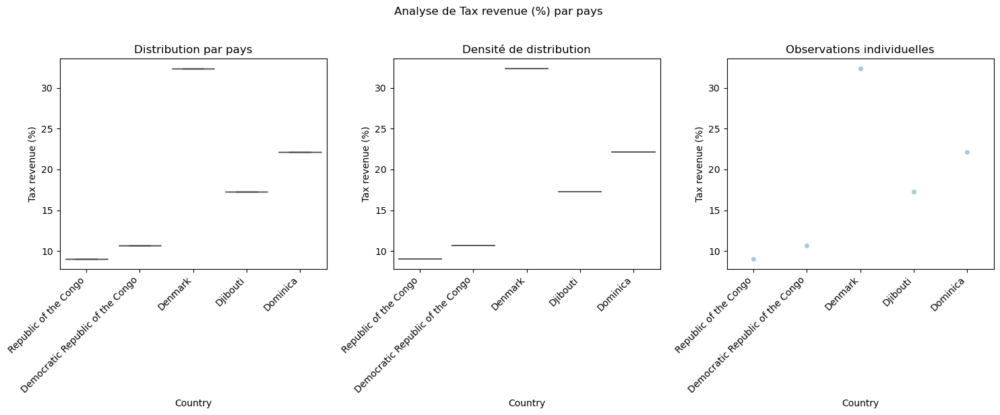


Statistiques descriptives pour Tax revenue (%):

Par pays :
                                  Nombre  Moyenne  Minimum  Maximum
Country                                                            
Democratic Republic of the Congo       1    10.70    10.70    10.70
Denmark                                1    32.40    32.40    32.40
Djibouti                               1    17.24    17.24    17.24
Dominica                               1    22.10    22.10    22.10
Republic of the Congo                  1     9.00     9.00     9.00

Statistiques globales :
Moyenne globale      18.29
Médiane globale      17.24
Écart-type global     9.47
Minimum global        9.00
Maximum global       32.40
dtype: float64

Test de Kruskal-Wallis:
p-value = 0.4060

Conclusion:
✓ Pas de différence significative entre les pays pour Tax revenue (%)
→ La distribution est similaire entre les pays
→ Les variations observées sont probablement dues au hasard

Democratic Republic of the Congo:
- Valeur: 10.70
- Éca

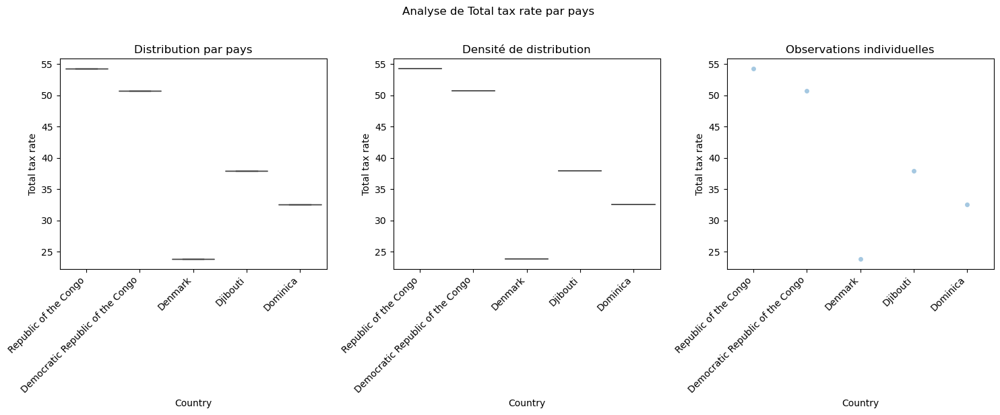


Statistiques descriptives pour Total tax rate:

Par pays :
                                  Nombre  Moyenne  Minimum  Maximum
Country                                                            
Democratic Republic of the Congo       1     50.7     50.7     50.7
Denmark                                1     23.8     23.8     23.8
Djibouti                               1     37.9     37.9     37.9
Dominica                               1     32.6     32.6     32.6
Republic of the Congo                  1     54.3     54.3     54.3

Statistiques globales :
Moyenne globale      39.86
Médiane globale      37.90
Écart-type global    12.65
Minimum global       23.80
Maximum global       54.30
dtype: float64

Test de Kruskal-Wallis:
p-value = 0.4060

Conclusion:
✓ Pas de différence significative entre les pays pour Total tax rate
→ La distribution est similaire entre les pays
→ Les variations observées sont probablement dues au hasard

Democratic Republic of the Congo:
- Valeur: 50.70
- Écart

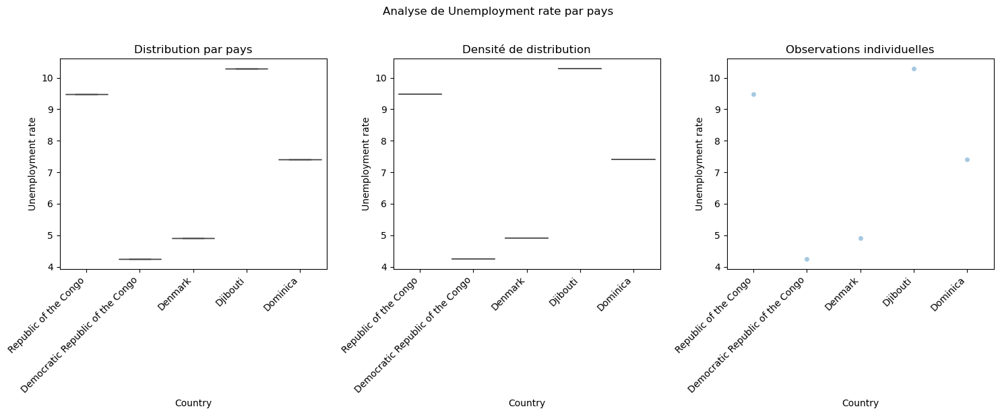


Statistiques descriptives pour Unemployment rate:

Par pays :
                                  Nombre  Moyenne  Minimum  Maximum
Country                                                            
Democratic Republic of the Congo       1     4.24     4.24     4.24
Denmark                                1     4.91     4.91     4.91
Djibouti                               1    10.30    10.30    10.30
Dominica                               1     7.42     7.42     7.42
Republic of the Congo                  1     9.47     9.47     9.47

Statistiques globales :
Moyenne globale       7.27
Médiane globale       7.42
Écart-type global     2.68
Minimum global        4.24
Maximum global       10.30
dtype: float64

Test de Kruskal-Wallis:
p-value = 0.4060

Conclusion:
✓ Pas de différence significative entre les pays pour Unemployment rate
→ La distribution est similaire entre les pays
→ Les variations observées sont probablement dues au hasard

Democratic Republic of the Congo:
- Valeur: 4.24
- 

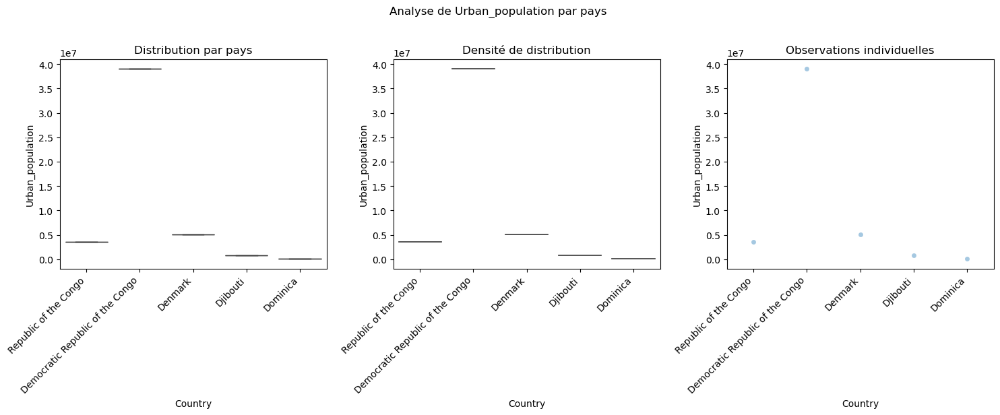


Statistiques descriptives pour Urban_population:

Par pays :
                                  Nombre     Moyenne     Minimum     Maximum
Country                                                                     
Democratic Republic of the Congo       1  39095679.0  39095679.0  39095679.0
Denmark                                1   5119978.0   5119978.0   5119978.0
Djibouti                               1    758549.0    758549.0    758549.0
Dominica                               1     50830.0     50830.0     50830.0
Republic of the Congo                  1   3625010.0   3625010.0   3625010.0

Statistiques globales :
Moyenne globale       9730009.20
Médiane globale       3625010.00
Écart-type global    16545691.08
Minimum global          50830.00
Maximum global       39095679.00
dtype: float64

Test de Kruskal-Wallis:
p-value = 0.4060

Conclusion:
✓ Pas de différence significative entre les pays pour Urban_population
→ La distribution est similaire entre les pays
→ Les variations obse

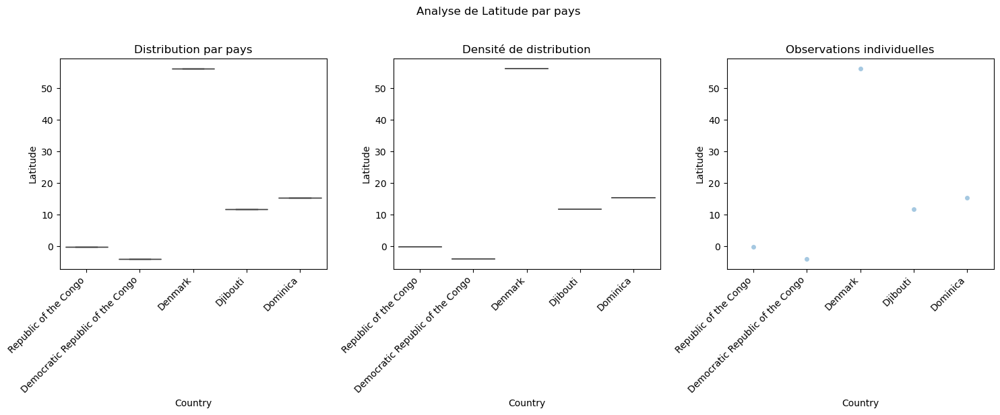


Statistiques descriptives pour Latitude:

Par pays :
                                  Nombre  Moyenne  Minimum  Maximum
Country                                                            
Democratic Republic of the Congo       1    -4.04    -4.04    -4.04
Denmark                                1    56.26    56.26    56.26
Djibouti                               1    11.83    11.83    11.83
Dominica                               1    15.41    15.41    15.41
Republic of the Congo                  1    -0.23    -0.23    -0.23

Statistiques globales :
Moyenne globale      15.85
Médiane globale      11.83
Écart-type global    24.00
Minimum global       -4.04
Maximum global       56.26
dtype: float64

Test de Kruskal-Wallis:
p-value = 0.4060

Conclusion:
✓ Pas de différence significative entre les pays pour Latitude
→ La distribution est similaire entre les pays
→ Les variations observées sont probablement dues au hasard

Democratic Republic of the Congo:
- Valeur: -4.04
- Écart à la moyenn

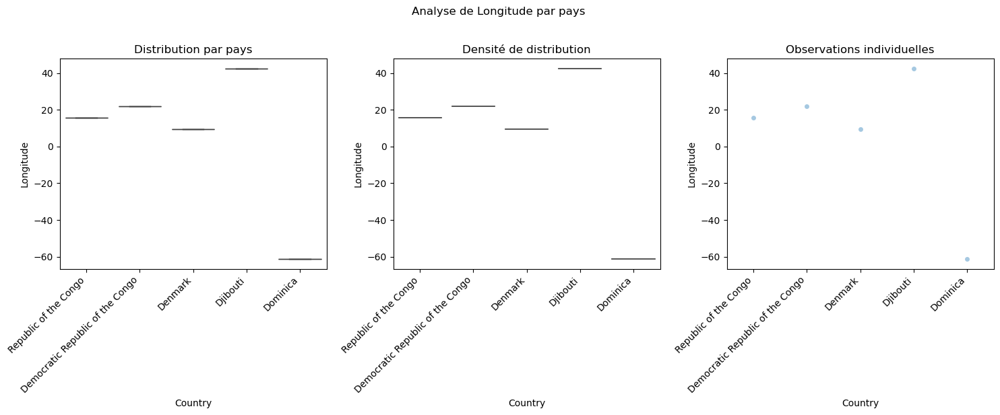


Statistiques descriptives pour Longitude:

Par pays :
                                  Nombre  Moyenne  Minimum  Maximum
Country                                                            
Democratic Republic of the Congo       1    21.76    21.76    21.76
Denmark                                1     9.50     9.50     9.50
Djibouti                               1    42.59    42.59    42.59
Dominica                               1   -61.37   -61.37   -61.37
Republic of the Congo                  1    15.83    15.83    15.83

Statistiques globales :
Moyenne globale       5.66
Médiane globale      15.83
Écart-type global    39.48
Minimum global      -61.37
Maximum global       42.59
dtype: float64

Test de Kruskal-Wallis:
p-value = 0.4060

Conclusion:
✓ Pas de différence significative entre les pays pour Longitude
→ La distribution est similaire entre les pays
→ Les variations observées sont probablement dues au hasard

Democratic Republic of the Congo:
- Valeur: 21.76
- Écart à la moye

In [32]:
analyse_num_cat(data_clean,max_categories=5)

## ANALYSE DES COMPOSANTES PRINCIPALES (ACP)

In [33]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from ACP import analyser_acp_complet
from pca import Pca_Analysis

In [34]:
data_acp = data_clean.copy()

In [35]:
data_acp.index=data_acp.Country

In [36]:
data_acp.drop('Country',axis=1,inplace=True)

In [37]:
data= data_acp.select_dtypes(include=np.number)

ANALYSE EN COMPOSANTES PRINCIPALES (ACP)
Implémentation compatible avec R (FactoMineR)

📊 RÉSUMÉ DE LA VARIANCE EXPLIQUÉE
----------------------------------------------------------------------
 PC  Valeur Propre  Variance (%)  Variance Cumulée (%)
PC1       6.473647     23.976470             23.976470
PC2       4.727753     17.510198             41.486668
PC3       2.033082      7.529933             49.016600
PC4       1.543309      5.715961             54.732561
PC5       1.449380      5.368072             60.100634
----------------------------------------------------------------------

🔝 TOP VARIABLES CONTRIBUTRICES À PC1
----------------------------------------------------------------------
                               Variable  Contribution (%)  Qualité (cos²)
                             Birth Rate         13.444629        0.972340
                       Infant mortality         13.133917        0.950645
                        Life expectancy         13.035519        0.959399
 

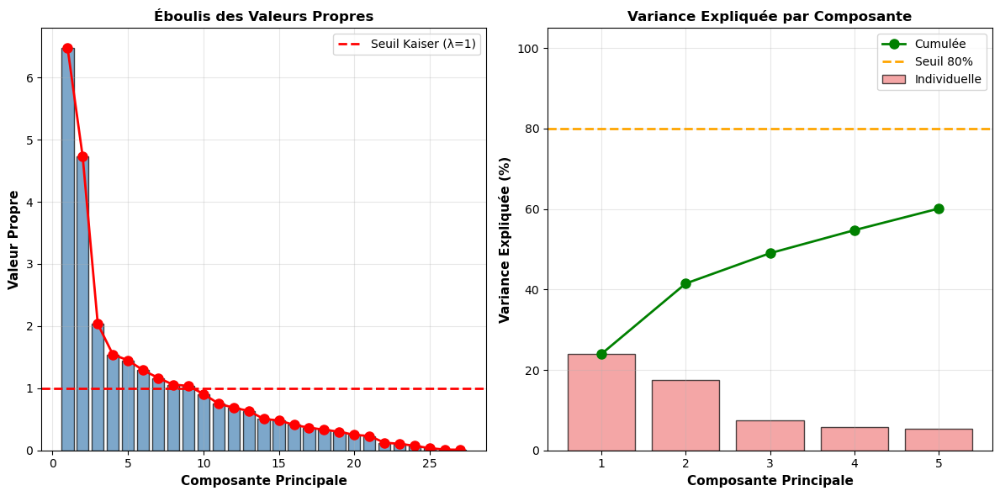

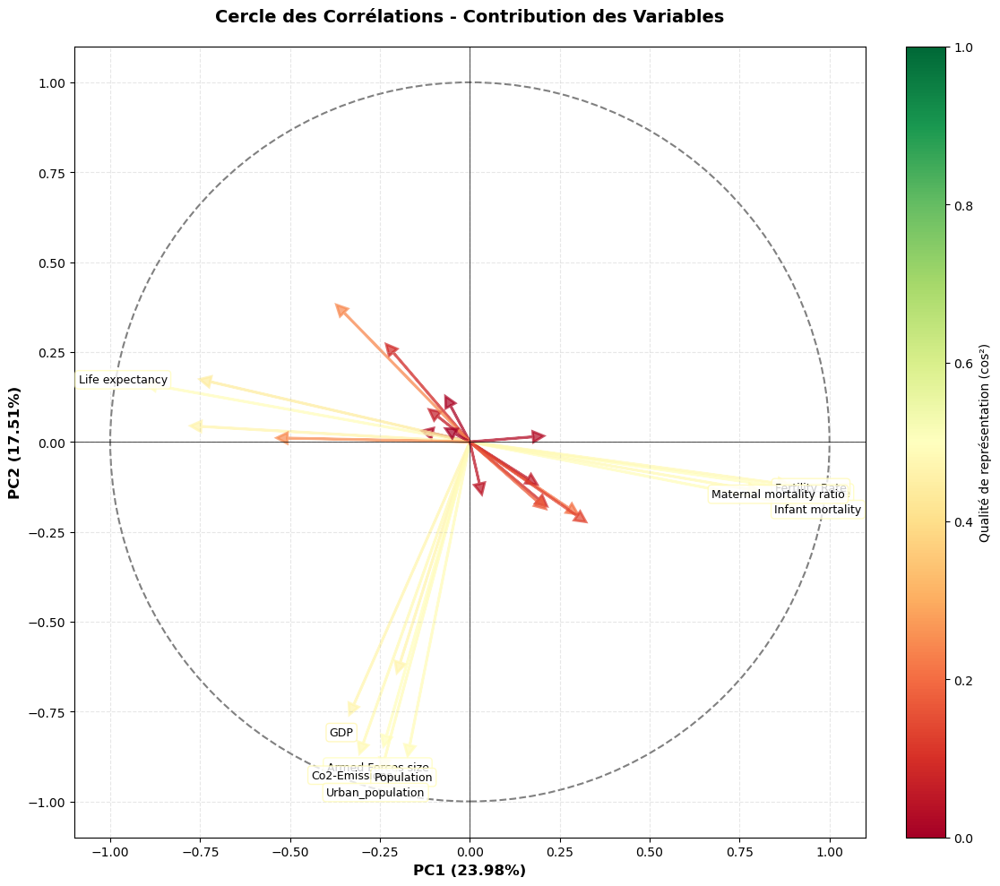

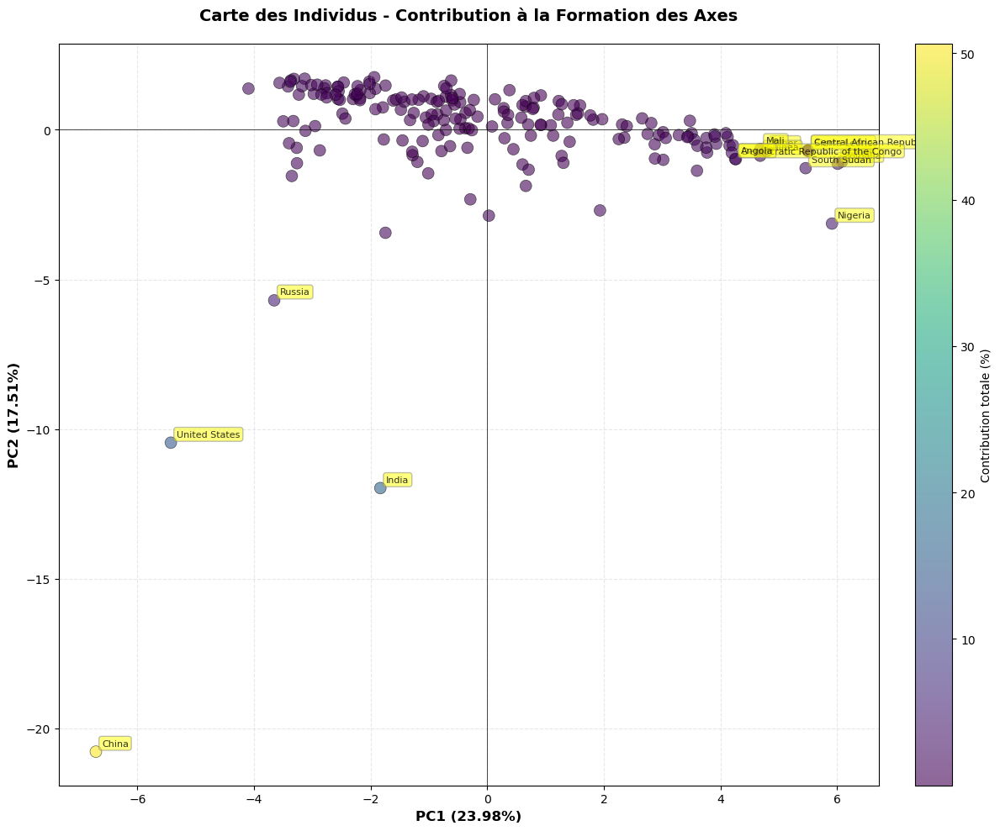

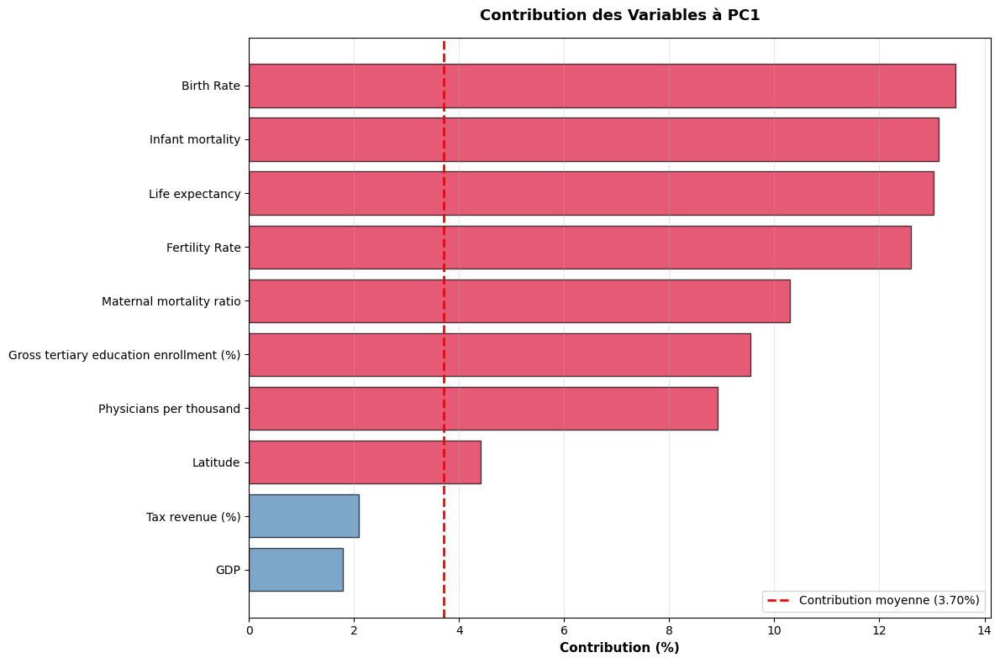

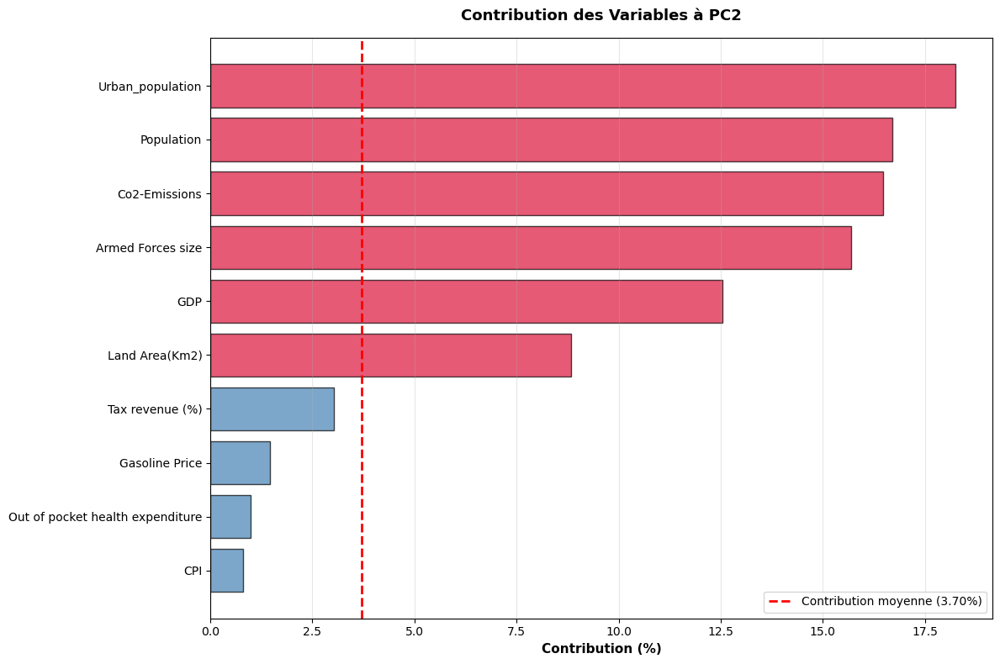

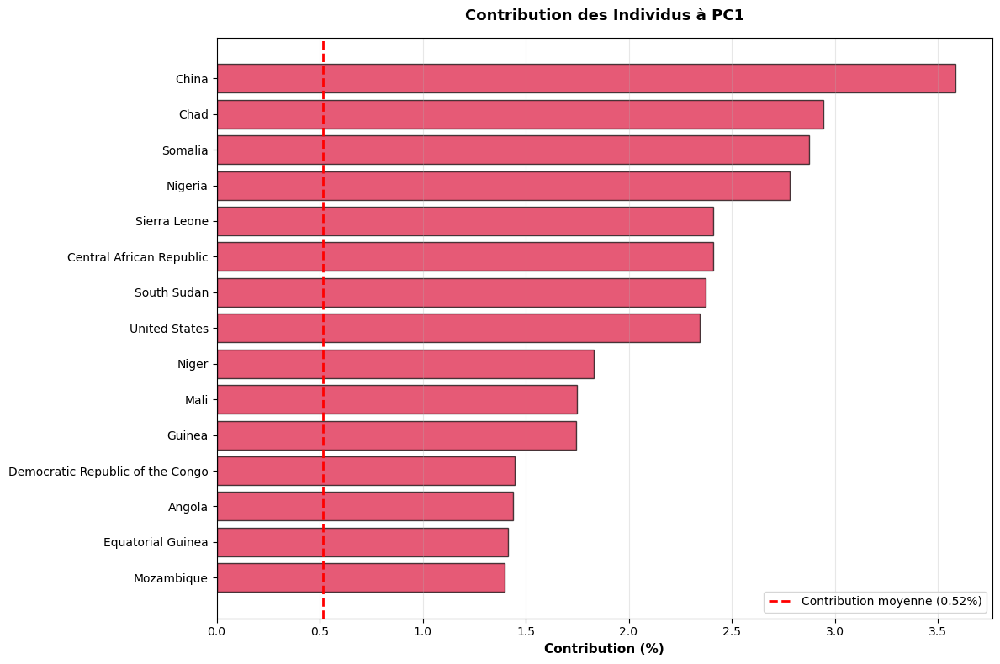

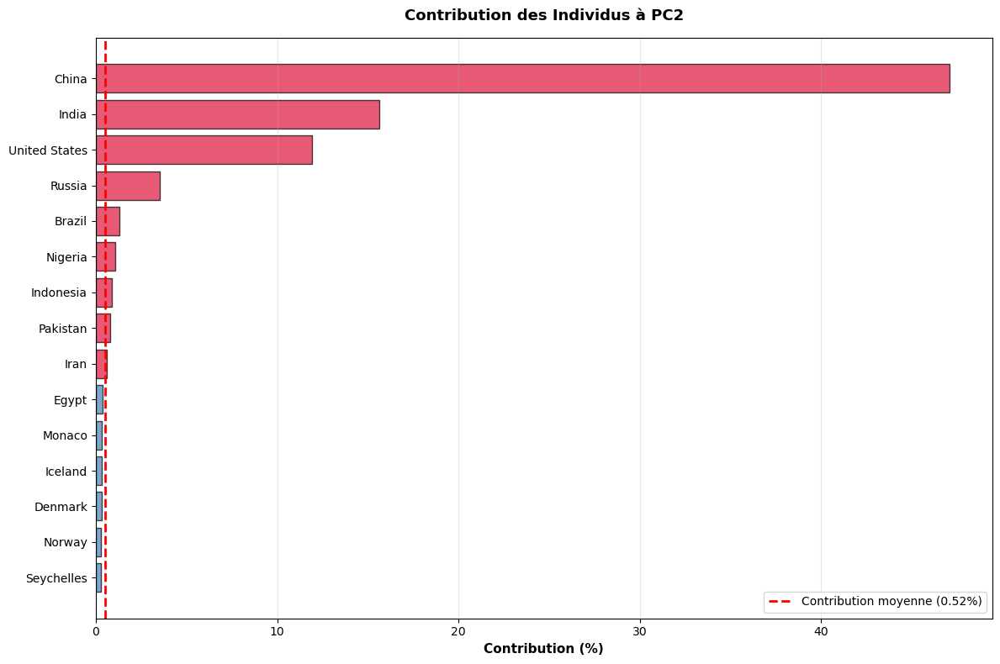


✅ ANALYSE COMPLÉTÉE AVEC SUCCÈS!

📋 ACCÈS AUX RÉSULTATS:
Modèle ACP: <class 'ACP.ACPAnalyzer'>
Données transformées: (194, 5)


In [38]:
 # Analyse ACP complète
resultats = analyser_acp_complet(
        data=data,
        n_components=5,
        scale=True,  # ACP normée (recommandé pour données économiques)
        n_top_var=10,
        n_top_ind=15,
        n_labels_circle=10,
        output_plots=True
    )
    
    # Accès aux résultats
print("\n📋 ACCÈS AUX RÉSULTATS:")
print(f"Modèle ACP: {type(resultats['model'])}")
print(f"Données transformées: {resultats['transformed_data'].shape}")

[6.50718904 4.75224957 2.04361596 1.55130587 1.4568893  1.29761335
 1.17199923 1.06285723 1.04370709 0.91299022 0.75659238 0.68967045
 0.63923775 0.50756709 0.48505376 0.41246788 0.36659731 0.33429056
 0.30208726 0.25040976 0.23320682 0.12410187 0.10619301 0.0735405
 0.03550881 0.01257982 0.01037448]
[6.47364683 4.72775344 2.03308186 1.54330945 1.44937956 1.29092462
 1.165958   1.05737859 1.03832716 0.90828409 0.75269242 0.68611545
 0.63594271 0.50495076 0.48255348 0.41034176 0.36470763 0.33256741
 0.30053011 0.24911899 0.23200473 0.12346217 0.10564562 0.07316142
 0.03532577 0.01251498 0.010321  ]
   dimension    eigval  variance  cumul
0       dim1  6.473647      24.0   24.0
1       dim2  4.727753      18.0   41.0
2       dim3  2.033082       8.0   49.0
3       dim4  1.543309       6.0   55.0
4       dim5  1.449380       5.0   60.0
5       dim6  1.290925       5.0   65.0
6       dim7  1.165958       4.0   69.0
7       dim8  1.057379       4.0   73.0
8       dim9  1.038327       4.0   

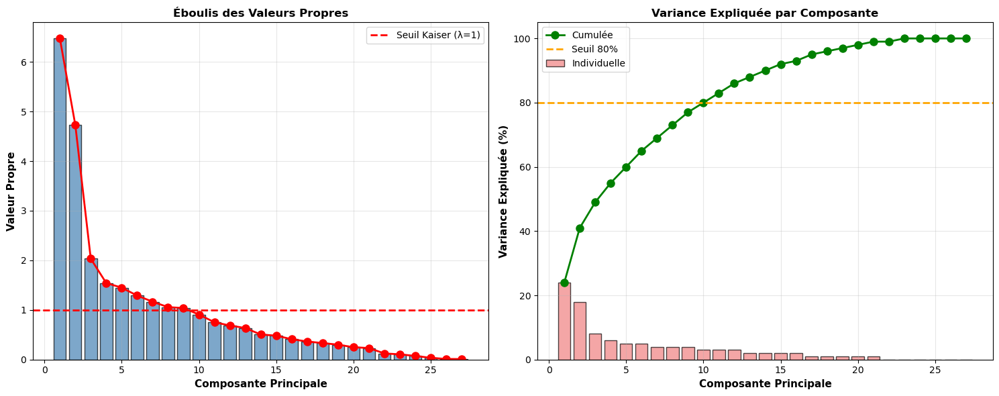

       individus      cos1      cos2
0    Afghanistan  0.447094  0.064812
1        Albania  0.263472  0.096411
2        Algeria  0.026507  0.001203
3        Andorra  0.016578  0.064941
4         Angola  0.651982  0.034404
..           ...       ...       ...
189    Venezuela  0.003762  0.013313
190      Vietnam  0.012106  0.038089
191        Yemen  0.223554  0.004305
192       Zambia  0.398873  0.002523
193     Zimbabwe  0.406784  0.008323

[194 rows x 3 columns]

Qualité de représentation des individus:
       individus      cos1      cos2
0    Afghanistan  0.447094  0.064812
1        Albania  0.263472  0.096411
2        Algeria  0.026507  0.001203
3        Andorra  0.016578  0.064941
4         Angola  0.651982  0.034404
..           ...       ...       ...
189    Venezuela  0.003762  0.013313
190      Vietnam  0.012106  0.038089
191        Yemen  0.223554  0.004305
192       Zambia  0.398873  0.002523
193     Zimbabwe  0.406784  0.008323

[194 rows x 3 columns]

Contribution des indi

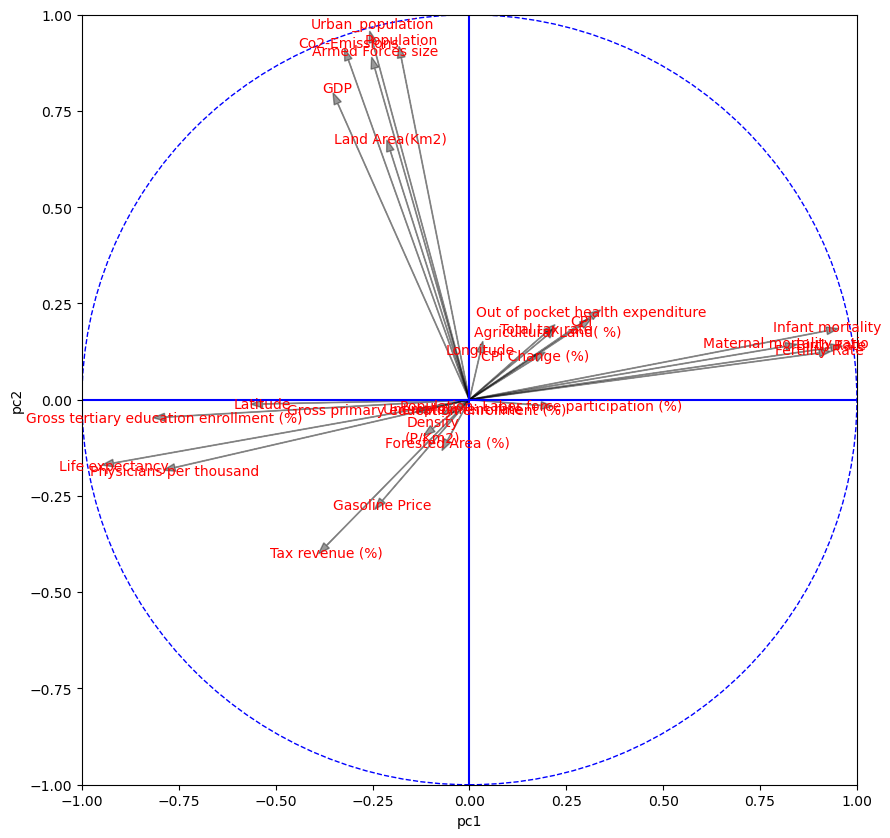

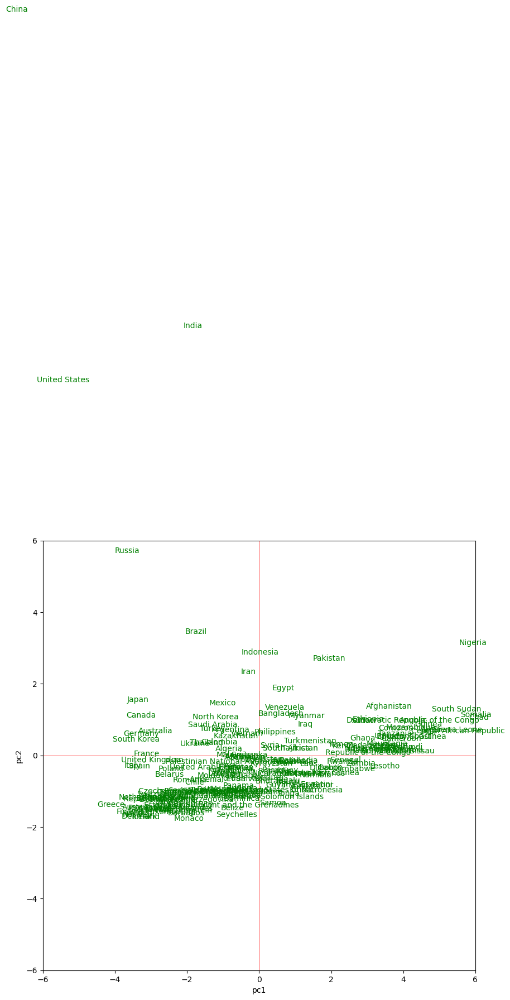

In [39]:
pca_analyzer=Pca_Analysis("Country")
pca_analyzer.composante(data_clean.copy())

# 2. Afficher le scree plot (éboulis des valeurs propres)
fig_scree = pca_analyzer.plot_scree(figsize=(15, 6))
plt.show()
# 3. Obtenir et afficher les qualités de représentation des individus
qualite_indiv, contrib_indiv = pca_analyzer.qualite_represent_indiv()
print("\nQualité de représentation des individus:")
print(qualite_indiv)
print("\nContribution des individus:")
print(contrib_indiv)

# 4. Obtenir et afficher les qualités de représentation des variables
qualite_var, contrib_var = pca_analyzer.qualite_represent_var()
print("\nQualité de représentation des variables:")
print(qualite_var)
print("\nContribution des variables:")
print(contrib_var)
# 5. Afficher le cercle des corrélations
pca_analyzer.cercle_correlation()
pca_analyzer.carte_indiv()






nous avons constaté que le graphique de correlation des variables montrent que la composante 1 est correlé avec les variables suivantes :taux de natalité,taux de fertilité ,taux,infant mortalité,esperence de vie,taux de mortalité marternelle, taux de scolarisation,nombre de de médecin pour 1000 habitat ,si nous observons bien sur cette composante, nous allons voir que les variables comme : taux de  natalité,taux de fertilité,mortalité enfantine sont opposées  à un autre groupe : espérance de vie,taux de scolarisation et nombre de médecin pour 1000 habitat.
concernant la composante 2 nous constatons que les variables suivantes sont correlées avec la composante 2,voici  ces variables :
taille de l'armée,emission de gaz carbonique,PIB,population et population urbaine
donc le resultat que nous avons trouvé avec ACP, ce dernier équivaut à ce que nous avons trouvé avec la matrice de correlation et le graphique de la regression lineare
basons-nous sur l'axe 1,la matrice de correlation et sur le graphique  de correlation et sur le test d'hypothèse on constaté par exemple que lorsque le taux de mortalité enfantile augmente  cela provoque la baisse de l'esperence de vie 

In [40]:
df=data_clean.copy()

In [41]:
df["continent"]= df['Country'].map(affect_pays_continent)

<Axes: ylabel='count'>

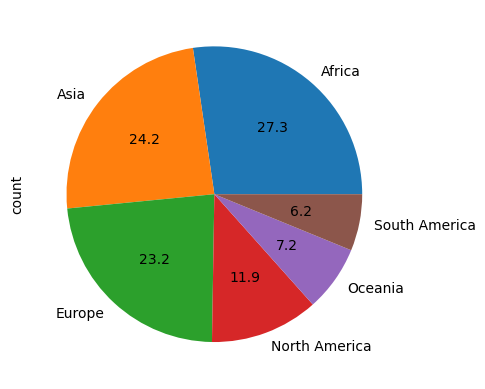

In [42]:
df["continent"].value_counts().plot.pie(autopct='%.1f')

## Analyse comparative entre continent  et pays

In [43]:
for  col in df.select_dtypes(exclude='object') :
    print("indcateur",col)
    display((df.groupby("continent")[col].agg(["sum",'mean','std'])).sort_values(ascending=False,by=['sum','mean','std']))

indcateur Density
(P/Km2)


,sum,mean,std
continent,,,
Europe,35247.0,783.266667,3911.764339
Asia,21291.0,453.000000,1258.550253
Africa,5570.0,105.094340,135.857570
North America,4343.0,188.826087,157.811928
Oceania,2590.0,185.000000,239.374184
South America,300.0,25.000000,18.645009


indcateur Agricultural Land( %)


,sum,mean,std
continent,,,
Africa,2460.36,46.421887,22.417305
Europe,1790.64,39.792000,17.421157
Asia,1741.40,37.051064,23.233838
North America,756.20,32.878261,19.508435
Oceania,441.84,31.560000,20.296341
South America,396.60,33.050000,22.649644


indcateur Land Area(Km2)


,sum,mean,std
continent,,,
Asia,31977048.0,6.803627e+05,1.519016e+06
Africa,30045284.0,5.668922e+05,6.034498e+05
Europe,23089038.0,5.130897e+05,2.534061e+06
North America,22524956.0,9.793459e+05,2.846507e+06
South America,17732340.0,1.477695e+06,2.334625e+06
Oceania,8538035.0,6.098596e+05,2.057020e+06


indcateur Armed Forces size


,sum,mean,std
continent,,,
Asia,15832800.0,336868.085106,608878.956025
Europe,4142000.0,92044.444444,225738.911492
Africa,3257200.0,61456.603774,129438.368924
North America,2131400.0,92669.565217,284867.462699
South America,2105000.0,175416.666667,227931.193100
Oceania,89000.0,6357.142857,15014.901024


indcateur Birth Rate


,sum,mean,std
continent,,,
Africa,1679.238,31.683736,7.620159
Asia,875.382,18.625149,6.415233
Europe,461.184,10.248533,3.724103
North America,368.420,16.018261,4.417781
Oceania,324.606,23.186143,6.366688
South America,208.490,17.374167,2.994250


indcateur Co2-Emissions


,sum,mean,std
continent,,,
Asia,19615541.0,417351.936170,1.469655e+06
North America,6209811.0,269991.782609,1.042812e+06
Europe,5404047.2,120089.937778,2.818014e+05
Africa,1377362.8,25987.977358,7.543149e+04
South America,1149928.0,95827.333333,1.326374e+05
Oceania,421266.4,30090.457143,9.995155e+04


indcateur CPI


,sum,mean,std
continent,,,
Africa,8597.850,162.223585,60.646918
Asia,7041.742,149.824298,66.235851
Europe,5664.204,125.871200,32.385062
North America,2983.286,129.708087,22.493267
South America,2090.112,174.176000,58.807674
Oceania,1673.858,119.561286,13.565733


indcateur CPI Change (%)


,sum,mean,std
continent,,,
Africa,501.06,9.453962,26.706557
South America,357.20,29.766667,72.489941
Asia,220.46,4.690638,7.929520
Europe,102.06,2.268000,1.787418
North America,67.52,2.935652,3.161409
Oceania,30.28,2.162857,1.716111


indcateur Fertility Rate


,sum,mean,std
continent,,,
Africa,220.968,4.169208,1.157930
Asia,111.702,2.376638,0.752128
Europe,73.468,1.632622,0.535530
North America,47.030,2.044783,0.403179
Oceania,44.856,3.204000,0.827966
South America,26.410,2.200833,0.336032


indcateur Forested Area (%)


,sum,mean,std
continent,,,
Europe,1461.80,32.484444,16.868567
Africa,1449.70,27.352830,23.809126
Asia,1089.84,23.188085,24.220268
North America,887.30,38.578261,16.562278
Oceania,729.40,52.100000,27.002877
South America,587.20,48.933333,26.274714


indcateur Gasoline Price


,sum,mean,std
continent,,,
Europe,58.366,1.297022,0.290696
Africa,51.090,0.963962,0.325760
Asia,37.208,0.791660,0.327150
North America,23.118,1.005130,0.271355
Oceania,16.330,1.166429,0.182629
South America,10.870,0.905833,0.380107


indcateur GDP


,sum,mean,std
continent,,,
Asia,3.764501e+13,8.009577e+11,2.975032e+12
North America,2.495782e+13,1.085123e+12,4.455320e+12
Europe,2.165453e+13,4.812117e+11,8.505632e+11
South America,3.855538e+12,3.212948e+11,5.076389e+11
Africa,2.442270e+12,4.608056e+10,8.774396e+10
Oceania,1.635040e+12,1.167886e+11,3.712850e+11


indcateur Gross primary education enrollment (%)


,sum,mean,std
continent,,,
Africa,5378.02,101.472075,21.058918
Asia,4829.04,102.745532,9.616234
Europe,4576.86,101.708000,5.914783
North America,2387.20,103.791304,9.088000
Oceania,1435.66,102.547143,9.343729
South America,1266.10,105.508333,6.199921


indcateur Gross tertiary education enrollment (%)


,sum,mean,std
continent,,,
Europe,2855.20,63.448889,24.179778
Asia,1721.66,36.631064,21.453119
North America,902.90,39.256522,28.236611
Africa,694.58,13.105283,12.623334
South America,625.96,52.163333,27.508401
Oceania,423.16,30.225714,32.175124


indcateur Infant mortality


,sum,mean,std
continent,,,
Africa,2306.30,43.515094,18.629478
Asia,821.92,17.487660,13.334764
North America,334.30,14.534783,10.146814
Oceania,291.48,20.820000,10.820155
Europe,232.98,5.177333,7.394753
South America,172.10,14.341667,6.164629


indcateur Life expectancy


,sum,mean,std
continent,,,
Europe,3525.42,78.342667,5.061647
Asia,3471.70,73.865957,4.666079
Africa,3378.90,63.752830,5.946318
North America,1727.60,75.113043,3.692659
Oceania,989.90,70.707143,5.500135
South America,899.20,74.933333,3.128849


indcateur Maternal mortality ratio


,sum,mean,std
continent,,,
Africa,22199.6,418.860377,279.961952
Asia,3644.6,77.544681,106.529626
Europe,2067.2,45.937778,113.914057
North America,1748.8,76.034783,92.845907
South America,1057.0,88.083333,52.084648
Oceania,919.4,65.671429,36.694716


indcateur Out of pocket health expenditure


,sum,mean,std
continent,,,
Asia,1941.74,41.313617,23.199176
Africa,1941.30,36.628302,18.513762
Europe,1150.58,25.568444,12.306823
North America,794.04,34.523478,13.317594
South America,346.00,28.833333,11.583478
Oceania,135.54,9.681429,7.233846


indcateur Physicians per thousand


,sum,mean,std
continent,,,
Europe,162.564,3.612533,1.224051
Asia,88.878,1.891021,1.398031
North America,45.570,1.981304,1.720009
South America,26.110,2.175833,1.219974
Africa,21.396,0.403698,0.553936
Oceania,12.880,0.920000,1.195067


indcateur Population


,sum,mean,std
continent,,,
Asia,4.543877e+09,9.667823e+07,2.798070e+08
Africa,1.309672e+09,2.471080e+07,3.505057e+07
Europe,7.453579e+08,1.656351e+07,2.841731e+07
North America,5.792514e+08,2.518484e+07,7.112127e+07
South America,4.285732e+08,3.571443e+07,5.811824e+07
Oceania,4.187626e+07,2.991162e+06,7.019353e+06


indcateur Population: Labor force participation (%)


,sum,mean,std
continent,,,
Africa,3447.06,65.038868,12.319055
Asia,2940.82,62.570638,12.285559
Europe,2672.40,59.386667,6.204503
North America,1467.34,63.797391,4.481263
Oceania,836.52,59.751429,9.999374
South America,777.10,64.758333,7.376555


indcateur Tax revenue (%)


,sum,mean,std
continent,,,
Europe,910.28,20.228444,4.768113
Africa,794.06,14.982264,7.670679
Asia,621.02,13.213191,5.722554
North America,400.86,17.428696,5.206219
Oceania,314.64,22.474286,4.269818
South America,182.80,15.233333,3.243806


indcateur Total tax rate


,sum,mean,std
continent,,,
Africa,2505.56,47.274717,28.417825
Europe,1751.64,38.925333,11.377413
Asia,1552.42,33.030213,14.366360
North America,937.02,40.740000,8.983646
South America,640.10,53.341667,25.623727
Oceania,579.48,41.391429,18.753613


indcateur Unemployment rate


,sum,mean,std
continent,,,
Africa,416.044,7.849887,6.294699
Europe,307.300,6.828889,3.871368
Asia,270.356,5.752255,4.373675
North America,182.574,7.938000,5.115787
South America,90.970,7.580833,3.113047
Oceania,74.858,5.347000,2.599505


indcateur Urban_population


,sum,mean,std
continent,,,
Asia,2.275537e+09,4.841568e+07,1.388930e+08
Africa,5.663475e+08,1.068580e+07,1.664443e+07
Europe,5.657722e+08,1.257271e+07,2.159636e+07
North America,4.606230e+08,2.002709e+07,5.872398e+07
South America,3.599768e+08,2.999807e+07,5.038637e+07
Oceania,3.292207e+07,2.351576e+06,5.828320e+06


indcateur Latitude


,sum,mean,std
continent,,,
Europe,2180.395395,48.453231,7.231246
Asia,1231.219437,26.196158,13.693806
North America,425.077027,18.481610,10.189607
Africa,152.940036,2.885661,15.968605
Oceania,-133.887157,-9.563368,14.057270
South America,-151.828551,-12.652379,16.765109


indcateur Longitude


,sum,mean,std
continent,,,
Asia,3570.669178,75.971685,30.613988
Oceania,1254.015981,89.572570,140.521176
Africa,930.795845,17.562186,20.312256
Europe,717.344231,15.940983,17.657963
South America,-773.926825,-64.493902,8.651118
North America,-1773.806119,-77.122005,14.404562


### comparaison entre les pays africain en se basant sur les indicateurs economiques

In [44]:
df_africain= df.loc[df.continent=='Africa']
for  col in df_africain.select_dtypes(exclude='object') :
    if col=='continent' :
        continue
    print("indcateur",col)
    display((df_africain.groupby("Country")[col].agg(["sum"])).sort_values(ascending=False,by=['sum']))

indcateur Density
(P/Km2)


,sum
Country,
Mauritius,626.0
Rwanda,525.0
Comoros,467.0
Burundi,463.0
The Gambia,239.0
Uganda,229.0
Nigeria,226.0
Seychelles,214.0
Malawi,203.0


indcateur Agricultural Land( %)


,sum
Country,
South Africa,79.80
Burundi,79.20
Nigeria,77.70
Lesotho,77.60
Eritrea,75.20
Rwanda,73.40
Djibouti,73.40
Uganda,71.90
Comoros,71.50


indcateur Land Area(Km2)


,sum
Country,
Algeria,2381741.0
Democratic Republic of the Congo,2344858.0
Sudan,1861484.0
Libya,1759540.0
Chad,1284000.0
Niger,1267000.0
Angola,1246700.0
Mali,1240192.0
South Africa,1219090.0


indcateur Armed Forces size


,sum
Country,
Egypt,836000.0
Algeria,317000.0
Morocco,246000.0
Nigeria,215000.0
Eritrea,202000.0
South Sudan,185000.0
Ethiopia,138000.0
Democratic Republic of the Congo,134000.0
Sudan,124000.0


indcateur Birth Rate


,sum
Country,
Niger,46.080
Chad,42.170
Somalia,41.750
Mali,41.540
Democratic Republic of the Congo,41.180
Angola,40.730
Burundi,39.010
The Gambia,38.540
Uganda,38.140


indcateur Co2-Emissions


,sum
Country,
South Africa,476644.0
Egypt,238560.0
Algeria,150006.0
Nigeria,120369.0
Morocco,61276.0
Libya,50564.0
Angola,34693.0
Tunisia,29937.0
Sudan,20000.0


indcateur CPI


,sum
Country,
Malawi,418.340
Egypt,288.570
Ghana,268.360
Nigeria,267.510
Guinea,262.950
Angola,261.730
Sierra Leone,234.160
Liberia,223.130
Zambia,212.310


indcateur CPI Change (%)


,sum
Country,
South Sudan,187.90
Sudan,51.00
Central African Republic,37.10
Liberia,23.60
Angola,17.10
Ethiopia,15.80
Sierra Leone,14.80
Eswatini,13.16
Nigeria,11.40


indcateur Fertility Rate


,sum
Country,
Niger,6.910
Somalia,6.070
Democratic Republic of the Congo,5.920
Mali,5.880
Chad,5.750
Angola,5.520
Burundi,5.410
Nigeria,5.390
The Gambia,5.220


indcateur Forested Area (%)


,sum
Country,
Gabon,90.0
Seychelles,88.4
Guinea-Bissau,69.8
Democratic Republic of the Congo,67.2
Republic of the Congo,65.4
Zambia,65.2
Equatorial Guinea,55.5
Eswatini,51.9
Tanzania,51.6


indcateur Gasoline Price


,sum
Country,
Eritrea,2.000
Democratic Republic of the Congo,1.490
Somalia,1.410
Central African Republic,1.410
Zambia,1.400
Zimbabwe,1.340
Djibouti,1.320
Eswatini,1.220
Burundi,1.210


indcateur GDP


,sum
Country,
Nigeria,4.481204e+11
South Africa,3.514316e+11
Egypt,3.031751e+11
Algeria,1.699882e+11
Morocco,1.187253e+11
Ethiopia,9.610766e+10
Kenya,9.550309e+10
Angola,9.463542e+10
Ghana,6.698363e+10


indcateur Gross primary education enrollment (%)


,sum
Country,
Malawi,142.50
Madagascar,142.50
Gabon,139.90
Rwanda,133.00
Namibia,124.20
Togo,123.80
Benin,122.00
Burundi,121.40
Lesotho,120.90


indcateur Gross tertiary education enrollment (%)


,sum
Country,
Libya,60.50
Algeria,51.40
Mauritius,40.60
Morocco,35.90
Egypt,35.20
Tunisia,31.70
Botswana,24.90
Cape Verde,23.60
Namibia,22.90


indcateur Infant mortality


,sum
Country,
Central African Republic,84.5
Sierra Leone,78.5
Somalia,76.6
Nigeria,75.7
Chad,71.4
Democratic Republic of the Congo,68.2
Lesotho,65.7
Guinea,64.9
South Sudan,63.7


indcateur Life expectancy


,sum
Country,
Algeria,76.7
Tunisia,76.5
Morocco,76.5
Mauritius,74.4
Cape Verde,72.8
Seychelles,72.8
Libya,72.7
Egypt,71.8
Botswana,69.3


indcateur Maternal mortality ratio


,sum
Country,
South Sudan,1150.0
Chad,1140.0
Sierra Leone,1120.0
Nigeria,917.0
Somalia,829.0
Central African Republic,829.0
Mauritania,766.0
Guinea-Bissau,667.0
Liberia,661.0


indcateur Out of pocket health expenditure


,sum
Country,
Comoros,74.8
Nigeria,72.2
Equatorial Guinea,72.0
Cameroon,69.7
Sudan,63.2
Egypt,62.0
South Sudan,61.3
Chad,56.4
Guinea,54.5


indcateur Physicians per thousand


,sum
Country,
Mauritius,2.530
Libya,2.090
Algeria,1.720
South Sudan,1.318
Tunisia,1.300
Zambia,1.190
Eswatini,1.118
Seychelles,0.950
South Africa,0.910


indcateur Population


,sum
Country,
Nigeria,200963599.0
Ethiopia,112078730.0
Egypt,100388073.0
Democratic Republic of the Congo,86790567.0
South Africa,58558270.0
Tanzania,58005463.0
Kenya,52573973.0
Uganda,44269594.0
Algeria,43053054.0


indcateur Population: Labor force participation (%)


,sum
Country,
Madagascar,86.10
Rwanda,83.70
Tanzania,83.40
Zimbabwe,83.10
Ethiopia,79.60
Burundi,79.20
Eritrea,78.40
Mozambique,78.10
Togo,77.60


indcateur Tax revenue (%)


,sum
Country,
Algeria,37.20
Seychelles,34.10
Lesotho,31.60
Eswatini,28.60
South Africa,27.50
Namibia,27.10
Morocco,21.90
Tunisia,21.10
Zimbabwe,20.70


indcateur Total tax rate


,sum
Country,
Comoros,219.60
Eritrea,83.70
Equatorial Guinea,79.40
Central African Republic,73.30
Guinea,69.30
Mauritania,67.00
Algeria,66.10
Chad,63.50
Tunisia,60.70


indcateur Unemployment rate


,sum
Country,
South Africa,28.180
Lesotho,23.410
Namibia,20.270
Gabon,20.000
Libya,18.560
Botswana,18.190
Sudan,16.530
Tunisia,16.020
Cape Verde,12.250


indcateur Urban_population


,sum
Country,
Nigeria,102806948.0
Egypt,42895824.0
South Africa,39149717.0
Democratic Republic of the Congo,39095679.0
Algeria,31510100.0
Ethiopia,23788710.0
Morocco,22975026.0
Angola,21061025.0
Tanzania,20011885.0


indcateur Latitude


,sum
Country,
Tunisia,33.886917
Morocco,31.791702
Algeria,28.033886
Egypt,26.820553
Libya,26.335100
Mauritania,21.007890
Niger,17.607789
Mali,17.570692
Cape Verde,16.538800


indcateur Longitude


,sum
Country,
Mauritius,57.552152
Seychelles,55.491977
Madagascar,46.869107
Somalia,46.199616
Comoros,43.333300
Djibouti,42.590275
Ethiopia,40.489673
Eritrea,39.782334
Kenya,37.906193


### ACP POUR LES CONTINENTS

In [45]:
df_acp = df.copy()

In [46]:
df_acp.drop(["Capital/Major City","Country"],axis=1,inplace=True)



In [47]:
df_acp

,Density\n(P/Km2),Agricultural Land( %),Land Area(Km2),Armed Forces size,Birth Rate,Co2-Emissions,CPI,CPI Change (%),Fertility Rate,Forested Area (%),...,Physicians per thousand,Population,Population: Labor force participation (%),Tax revenue (%),Total tax rate,Unemployment rate,Urban_population,Latitude,Longitude,continent
0,60.0,58.1,652230.0,323000.0,32.49,8672.0,149.900,2.30,4.47,2.1,...,0.28,38041754.0,48.90,9.30,71.40,11.120,9797273.0,33.939110,67.709953,Asia
1,105.0,43.1,28748.0,9000.0,11.78,4536.0,119.050,1.40,1.62,28.1,...,1.20,2854191.0,55.70,18.60,36.60,12.330,1747593.0,41.153332,20.168331,Europe
2,18.0,17.4,2381741.0,317000.0,24.28,150006.0,151.360,2.00,3.02,0.8,...,1.72,43053054.0,41.20,37.20,66.10,11.700,31510100.0,28.033886,1.659626,Africa
3,164.0,40.0,468.0,10800.0,7.20,469.0,169.706,6.82,1.27,34.0,...,3.33,77142.0,70.06,16.54,34.84,8.058,67873.0,42.506285,1.521801,Europe
4,26.0,47.5,1246700.0,117000.0,40.73,34693.0,261.730,17.10,5.52,46.3,...,0.21,31825295.0,77.50,9.20,49.10,6.890,21061025.0,-11.202692,17.873887,Africa
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
190,32.0,24.5,912050.0,343000.0,17.88,164175.0,257.272,254.90,2.27,52.7,...,1.92,28515829.0,59.70,13.68,73.30,8.800,25162368.0,6.423750,-66.589730,South America
191,314.0,39.3,331210.0,522000.0,16.75,192668.0,163.520,2.80,2.05,48.1,...,0.82,96462106.0,77.40,19.10,37.60,2.010,35332140.0,14.058324,108.277199,Asia
192,56.0,44.6,527968.0,40000.0,30.45,10609.0,157.580,8.10,3.79,1.0,...,0.31,29161922.0,38.00,18.12,26.60,12.910,10869523.0,15.552727,48.516388,Asia
193,25.0,32.1,752618.0,16000.0,36.19,5141.0,212.310,9.20,4.63,65.2,...,1.19,17861030.0,74.60,16.20,15.60,11.430,7871713.0,-13.133897,27.849332,Africa


In [48]:
df.columns

Index(['Country', 'Density\n(P/Km2)', 'Agricultural Land( %)',
       'Land Area(Km2)', 'Armed Forces size', 'Birth Rate',
       'Capital/Major City', 'Co2-Emissions', 'CPI', 'CPI Change (%)',
       'Fertility Rate', 'Forested Area (%)', 'Gasoline Price', 'GDP',
       'Gross primary education enrollment (%)',
       'Gross tertiary education enrollment (%)', 'Infant mortality',
       'Largest city', 'Life expectancy', 'Maternal mortality ratio',
       'Official language', 'Out of pocket health expenditure',
       'Physicians per thousand', 'Population',
       'Population: Labor force participation (%)', 'Tax revenue (%)',
       'Total tax rate', 'Unemployment rate', 'Urban_population', 'Latitude',
       'Longitude', 'continent'],
      dtype='object')

In [49]:
df_acp.drop(["Largest city","Official language","Official language","Latitude",'Longitude','Out of pocket health expenditure', 'Largest city','Tax revenue (%)','CPI','CPI Change (%)','Gasoline Price'],axis=1,inplace=True)

In [50]:
df_acp

,Density\n(P/Km2),Agricultural Land( %),Land Area(Km2),Armed Forces size,Birth Rate,Co2-Emissions,Fertility Rate,Forested Area (%),GDP,Gross primary education enrollment (%),...,Infant mortality,Life expectancy,Maternal mortality ratio,Physicians per thousand,Population,Population: Labor force participation (%),Total tax rate,Unemployment rate,Urban_population,continent
0,60.0,58.1,652230.0,323000.0,32.49,8672.0,4.47,2.1,1.910135e+10,104.0,...,47.9,64.50,638.0,0.28,38041754.0,48.90,71.40,11.120,9797273.0,Asia
1,105.0,43.1,28748.0,9000.0,11.78,4536.0,1.62,28.1,1.527808e+10,107.0,...,7.8,78.50,15.0,1.20,2854191.0,55.70,36.60,12.330,1747593.0,Europe
2,18.0,17.4,2381741.0,317000.0,24.28,150006.0,3.02,0.8,1.699882e+11,109.9,...,20.1,76.70,112.0,1.72,43053054.0,41.20,66.10,11.700,31510100.0,Africa
3,164.0,40.0,468.0,10800.0,7.20,469.0,1.27,34.0,3.154058e+09,106.4,...,2.7,63.34,436.8,3.33,77142.0,70.06,34.84,8.058,67873.0,Europe
4,26.0,47.5,1246700.0,117000.0,40.73,34693.0,5.52,46.3,9.463542e+10,113.5,...,51.6,60.80,241.0,0.21,31825295.0,77.50,49.10,6.890,21061025.0,Africa
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
190,32.0,24.5,912050.0,343000.0,17.88,164175.0,2.27,52.7,4.823593e+11,97.2,...,21.4,72.10,125.0,1.92,28515829.0,59.70,73.30,8.800,25162368.0,South America
191,314.0,39.3,331210.0,522000.0,16.75,192668.0,2.05,48.1,2.619212e+11,110.6,...,16.5,75.30,43.0,0.82,96462106.0,77.40,37.60,2.010,35332140.0,Asia
192,56.0,44.6,527968.0,40000.0,30.45,10609.0,3.79,1.0,2.691440e+10,93.6,...,42.9,66.10,164.0,0.31,29161922.0,38.00,26.60,12.910,10869523.0,Asia
193,25.0,32.1,752618.0,16000.0,36.19,5141.0,4.63,65.2,2.306472e+10,98.7,...,40.4,63.50,213.0,1.19,17861030.0,74.60,15.60,11.430,7871713.0,Africa


[5.9696603  4.46820228 1.76112204 1.27514452 1.05174527 1.02755167
 0.97401953 0.76542299 0.58405947 0.48012701 0.44312599 0.36829234
 0.28621878 0.24793755 0.13543895 0.12441723 0.07849212 0.0370969
 0.01300632 0.01254567]
[5.93888886 4.44517031 1.75204409 1.26857161 1.0463239  1.02225501
 0.96899881 0.76147751 0.58104885 0.47765212 0.44084183 0.36639393
 0.28474343 0.24665953 0.13474081 0.1237759  0.07808752 0.03690568
 0.01293928 0.012481  ]
   dimension    eigval  variance  cumul
0       dim1  5.938889      30.0   30.0
1       dim2  4.445170      22.0   52.0
2       dim3  1.752044       9.0   61.0
3       dim4  1.268572       6.0   67.0
4       dim5  1.046324       5.0   72.0
5       dim6  1.022255       5.0   77.0
6       dim7  0.968999       5.0   82.0
7       dim8  0.761478       4.0   86.0
8       dim9  0.581049       3.0   89.0
9      dim10  0.477652       2.0   91.0
10     dim11  0.440842       2.0   94.0
11     dim12  0.366394       2.0   95.0
12     dim13  0.284743       1.

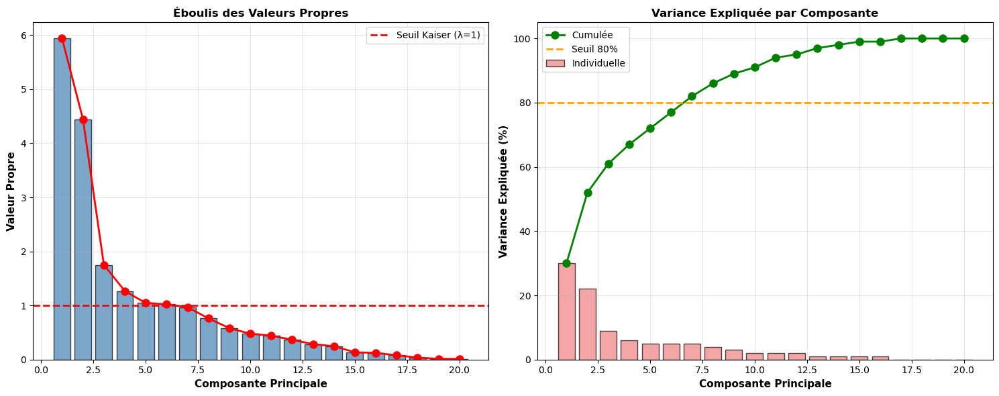

         individus      cos1      cos2
0             Asia  0.496733  0.118757
1           Europe  0.274013  0.245060
2           Africa  0.026874  0.012385
3           Europe  0.000822  0.074884
4           Africa  0.634677  0.098659
..             ...       ...       ...
189  South America  0.093355  0.000138
190           Asia  0.052669  0.016558
191           Asia  0.239153  0.012183
192         Africa  0.450283  0.010669
193         Africa  0.578157  0.024756

[194 rows x 3 columns]

Qualité de représentation des individus:
         individus      cos1      cos2
0             Asia  0.496733  0.118757
1           Europe  0.274013  0.245060
2           Africa  0.026874  0.012385
3           Europe  0.000822  0.074884
4           Africa  0.634677  0.098659
..             ...       ...       ...
189  South America  0.093355  0.000138
190           Asia  0.052669  0.016558
191           Asia  0.239153  0.012183
192         Africa  0.450283  0.010669
193         Africa  0.578157  0.02475

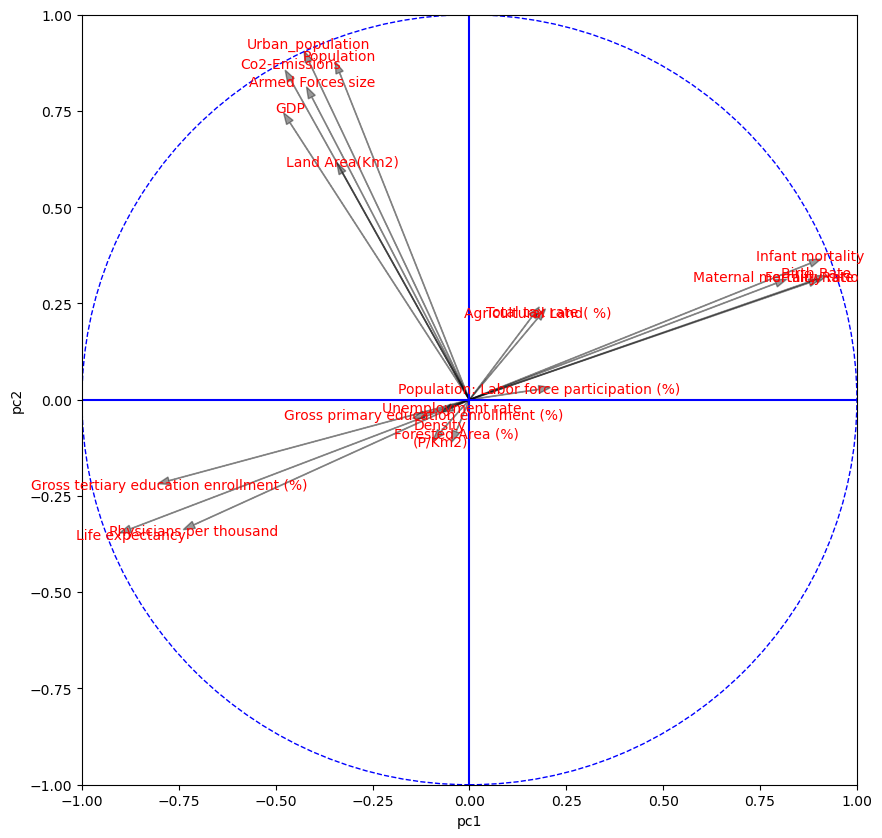

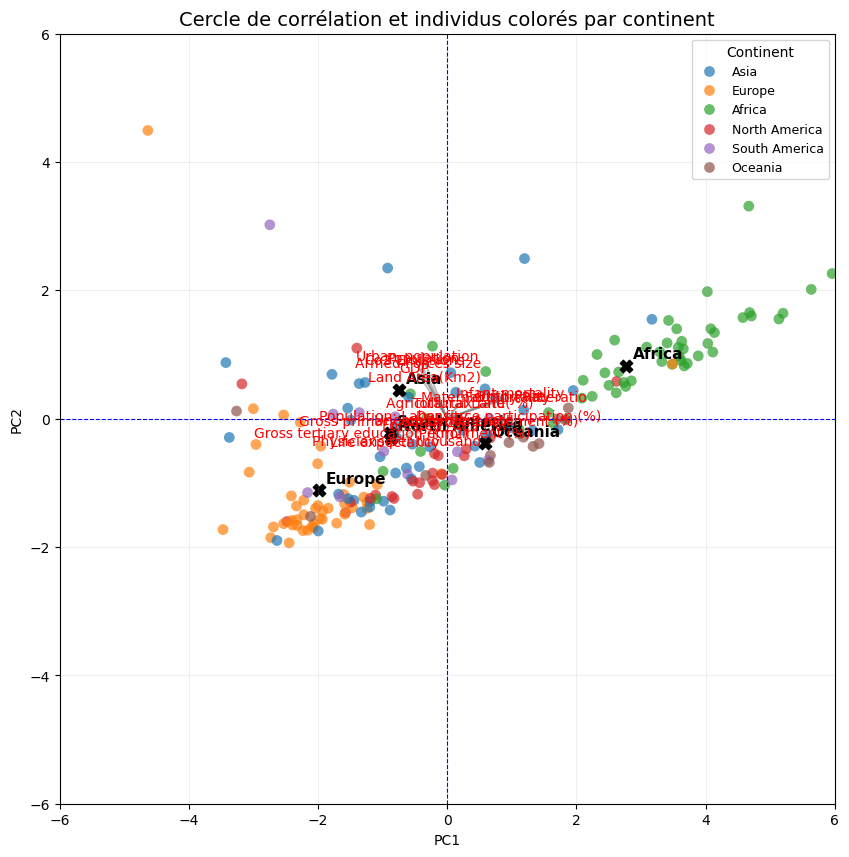

In [53]:
pca_analyzer=Pca_Analysis("continent")
pca_analyzer.composante(df_acp.copy())

# 2. Afficher le scree plot (éboulis des valeurs propres)
fig_scree = pca_analyzer.plot_scree(figsize=(15, 6))
plt.show()
# 3. Obtenir et afficher les qualités de représentation des individus
qualite_indiv, contrib_indiv = pca_analyzer.qualite_represent_indiv()
print("\nQualité de représentation des individus:")
print(qualite_indiv)
print("\nContribution des individus:")
print(contrib_indiv)

# 4. Obtenir et afficher les qualités de représentation des variables
qualite_var, contrib_var = pca_analyzer.qualite_represent_var()
print("\nQualité de représentation des variables:")
print(qualite_var)
print("\nContribution des variables:")
print(contrib_var)
# 5. Afficher le cercle des corrélations
pca_analyzer.cercle_correlation()
plt.show()
pca_analyzer.grap_cercle_correlation_var_ind()



In [52]:
pca_analyzer.coorv

,f1,f2
var,,
Africa,2.773011,0.825495
Asia,-0.747308,0.449859
Europe,-1.987697,-1.114563
North America,-0.864725,-0.295750
Oceania,0.577419,-0.378370
South America,-0.882910,-0.219982


# Rapport d’analyse factorielle des pays par continent
1. Contexte et objectif de l’étude

L’objectif de cette analyse est d’étudier les relations entre plusieurs indicateurs socio-économiques et sanitaires des pays à travers les continents.
Les variables considérées incluent des indicateurs démographiques (taux de natalité, taux de fertilité, taux de mortalité infantile, etc.), économiques (PIB, taille de l’armée, émissions de CO₂, population urbaine), et sociaux (espérance de vie, taux de scolarisation, nombre de médecins pour 1 000 habitants).
L’analyse en composantes principales (ACP) a été utilisée afin de réduire la dimensionnalité des données tout en conservant la structure de corrélation entre les variables.

2. Interprétation des axes principaux
2.1. Axe 1 (Composante principale 1)

La première composante est fortement corrélée avec les variables suivantes :

Taux de natalité

Taux de fertilité

Taux de mortalité infantile

Ces variables sont opposées à un second groupe de variables :

Espérance de vie

Taux de scolarisation

Nombre de médecins pour 1 000 habitants

Ainsi, l’axe 1 traduit un contraste entre des pays à faible développement sanitaire et éducatif (caractérisés par une forte natalité et mortalité infantile) et des pays à haut niveau de développement humain (caractérisés par une forte espérance de vie et une meilleure couverture médicale).
Cet axe peut donc être interprété comme un axe de développement humain.

2.2. Axe 2 (Composante principale 2)

La seconde composante est principalement corrélée avec :

Taille de l’armée

Émissions de CO₂

PIB

Population totale

Population urbaine

Elle exprime donc une dimension davantage économique et démographique, traduisant la puissance économique et la densité démographique des pays.

3. Interprétation géographique (par continent)

In [ ]:
| Continent            | Axe 1 (f1) | Axe 2 (f2) |
| -------------------- | ---------- | ---------- |
| **Afrique**          | 2.77       | 0.83       |
| **Asie**             | -0.75      | 0.45       |
| **Europe**           | -1.99      | -1.11      |
| **Amérique du Nord** | -0.86      | -0.30      |
| **Océanie**          | 0.58       | -0.38      |
| **Amérique du Sud**  | -0.88      | -0.22      |


L’Afrique présente un score très positif sur l’axe 1, indiquant une forte corrélation avec les variables de natalité et de mortalité infantile. Cela traduit un niveau de développement humain relativement faible.

L’Europe, à l’inverse, présente un score négatif élevé, caractérisant un haut niveau de développement sanitaire et éducatif (forte espérance de vie, scolarisation, accès aux soins).

L’Océanie se positionne légèrement du côté africain, traduisant certaines similitudes avec les indicateurs démographiques observés sur ce continent.

L’Asie, l’Amérique du Nord et l’Amérique du Sud se situent entre les deux extrêmes, se rapprochant davantage du profil européen sur le plan du développement humain.

Analyse de l’axe 2

L’axe 2 montre également une opposition notable entre l’Europe et l’Afrique, mais cette fois sur le plan économique et démographique.

Les continents asiatique et africain se rapprochent légèrement, indiquant une dynamique commune en termes de croissance démographique et d’émissions de CO₂ liées à l’industrialisation et à la taille de la population.

L’Amérique du Nord, quant à elle, reste positionnée dans une zone modérément négative, traduisant une économie avancée mais une densité de population relativement faible.

5. Conclusion

L’analyse en composantes principales met en évidence deux grandes dimensions structurantes des différences entre continents :

Le développement humain (axe 1) : opposant les pays à forte mortalité infantile et faible scolarisation aux pays à espérance de vie et éducation élevées.

La puissance économique et démographique (axe 2) : traduisant les écarts en matière de PIB, d’industrialisation et de taille de population.

Sur cette base, l’Afrique apparaît comme le continent le plus en retrait sur le plan sanitaire et social, tandis que l’Europe se distingue par ses indicateurs de bien-être.
Les continents asiatique et océanique présentent des profils intermédiaires, traduisant une transition entre développement démographique et économique.
L’ensemble confirme la cohérence entre les résultats de l’ACP, les corrélations observées et les tests statistiques réalisés.